In [1]:
# 外部ライブラリのインポート_
import pandas as pd
import numpy as np
from datetime import datetime
import pickle
import matplotlib.pyplot as plt

# 自作パッケージのインポート
from libs_QSM.Prepare_data import Prepare_data
from libs_QSM.Estimate_params import Estimate_params
from libs_QSM.Solve_equilibrium import Solve_equilibrium

In [2]:
# index
jcode = pd.read_csv('data/2020/jcode.csv', dtype={'jcode':str})['jcode'].to_list()
# params
df_param = pd.read_csv('data/2020/param.csv')
param = {}
param['alpha'] = df_param['alpha'].to_list()[0]
param['gamma'] = df_param['gamma'].to_list()[0]
param['psi'] = df_param['psi'].to_list()[0]
param['beta_cns'] = df_param['beta_cns'].to_list()[0]
param['beta_flr'] = df_param['beta_flr'].to_list()[0]
param['beta_chd'] = df_param['beta_chd'].to_list()[0]
# previous exogenous variables
df_scaler = pd.read_csv('data/2000/scaler.csv')
df_p_i = pd.read_csv('data/2000/p_i.csv', dtype={'jcode':str})
df_K_i = pd.read_csv('sources/K_i.csv', dtype={'jcode':str})
df_tau_ij = pd.read_csv('data/2000/tau_ij.csv', dtype={0:str}, index_col=0)
df_t_ij = pd.read_csv('data/2000/t_ij.csv', dtype={0:str}, index_col=0)
prev_exog = {}
prev_exog['T'] = df_scaler['T'].to_list()[0]
prev_exog['N'] = df_scaler['N'].to_list()[0]
prev_exog['L'] = df_scaler['L'].to_list()[0]
prev_exog['mu_cost'] = df_scaler['mu_cost'].to_list()[0]
prev_exog['mu_room'] = df_scaler['mu_room'].to_list()[0]
prev_exog['p_i'] = df_p_i['p_i'].to_numpy()
prev_exog['K_i'] = df_K_i['K_i'].to_numpy()
prev_exog['tau_ij'] = df_tau_ij.to_numpy()
prev_exog['t_ij'] = df_t_ij.to_numpy()
# previous reference endogenous variables
df_w_j = pd.read_csv('data/2000/w_j.csv', dtype={'jcode':str})
df_q_i = pd.read_csv('data/2000/q_i.csv', dtype={'jcode':str})
df_Q_j = pd.read_csv('data/2000/Q_j.csv', dtype={'jcode':str})
df_Pi_ij = pd.read_csv('data/2000/Pi_ij.csv', dtype={0:str}, index_col=0)
df_n_ij = pd.read_csv('data/2000/n_ij.csv', dtype={0:str}, index_col=0)
df_theta_i = pd.read_csv('data/2000/theta_i.csv', dtype={'jcode':str})
prev_ref = {}
prev_ref['w_j'] = df_w_j['w_j'].to_numpy()
prev_ref['q_i'] = df_q_i['q_i'].to_numpy()
prev_ref['Q_j'] = df_Q_j['Q_j'].to_numpy()
prev_ref['Pi_ij'] = df_Pi_ij.to_numpy()
prev_ref['n_ij'] = df_n_ij.to_numpy()
prev_exog['theta_i'] = df_theta_i['theta_i'].to_numpy()
# next exogenous variables
df_scaler = pd.read_csv('data/2020/scaler.csv')
df_p_i = pd.read_csv('data/2020/p_i.csv', dtype={'jcode':str})
df_K_i = pd.read_csv('sources/K_i.csv', dtype={'jcode':str})
df_tau_ij = pd.read_csv('data/2020/tau_ij.csv', dtype={0:str}, index_col=0)
df_t_ij = pd.read_csv('data/2020/t_ij.csv', dtype={0:str},index_col=0)
next_exog = {}
next_exog['T'] = df_scaler['T'].to_list()[0]
next_exog['N'] = df_scaler['N'].to_list()[0]
next_exog['L'] = df_scaler['L'].to_list()[0]
next_exog['mu_cost'] = df_scaler['mu_cost'].to_list()[0]
next_exog['mu_room'] = df_scaler['mu_room'].to_list()[0]
next_exog['p_i'] = df_p_i['p_i'].to_numpy()
next_exog['K_i'] = df_K_i['K_i'].to_numpy()
next_exog['tau_ij'] = df_tau_ij.to_numpy()
next_exog['t_ij'] = df_t_ij.to_numpy()
# next reference endogenous variables
df_w_j = pd.read_csv('data/2020/w_j.csv', dtype={'jcode':str})
df_q_i = pd.read_csv('data/2020/q_i.csv', dtype={'jcode':str})
df_Q_j = pd.read_csv('data/2020/Q_j.csv', dtype={'jcode':str})
df_Pi_ij = pd.read_csv('data/2020/Pi_ij.csv', dtype={0:str}, index_col=0)
df_n_ij = pd.read_csv('data/2020/n_ij.csv', dtype={0:str}, index_col=0)
df_theta_i = pd.read_csv('data/2020/theta_i.csv', dtype={'jcode':str})
next_ref = {}
next_ref['w_j'] = df_w_j['w_j'].to_numpy()
next_ref['q_i'] = df_q_i['q_i'].to_numpy()
next_ref['Q_j'] = df_Q_j['Q_j'].to_numpy()
next_ref['Pi_ij'] = df_Pi_ij.to_numpy()
next_ref['n_ij'] = df_n_ij.to_numpy()
next_exog['theta_i'] = df_theta_i['theta_i'].to_numpy()

In [3]:
f_1 = Prepare_data(jcode) #111
f_1.set_param(param)
f_1.set_exog_prev(prev_exog)
f_1.set_exog_next(next_exog)

f_1.set_ref_prev(prev_ref)
f_1.set_ref_next(next_ref)
f_1.calc_dep_prev()
f_1.calc_dep_next()

alpha array has been stored.
gamma array has been stored.
psi array has been stored.
beta_cns array has been stored.
beta_flr array has been stored.
beta_chd array has been stored.
T array has been correctly stored.
N array has been correctly stored.
L array has been correctly stored.
mu_cost array has been correctly stored.
mu_room array has been correctly stored.
p_i array has been stored.
K_i array has been stored.
theta_i array has been stored.
tau_ij array has been stored.
t_ij array has been stored.
T array has been correctly stored.
N array has been correctly stored.
L array has been correctly stored.
mu_cost array has been correctly stored.
mu_room array has been correctly stored.
p_i array has been stored.
K_i array has been stored.
theta_i array has been stored.
tau_ij array has been stored.
t_ij array has been stored.
q_i array has been stored.
w_j array has been stored.
Q_j array has been stored.
Pi_ij array has been stored.
n_ij array has been stored.
q_i array has been st

In [4]:
0.0822*24

1.9727999999999999

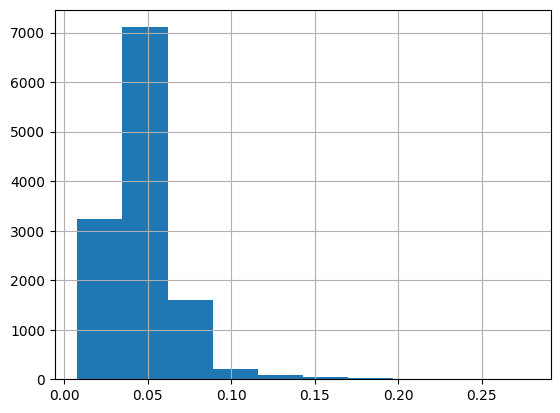

In [6]:
df = pd.DataFrame(np.ravel(f_1.ref_prev['H_R_ij']))
df[df[0] > 0].hist()
plt.title('') 
plt.show()

In [4]:
# 値がない時は前後の値を代入
prev_t = prev_exog['t_ij'].copy()
next_t = next_exog['t_ij'].copy()

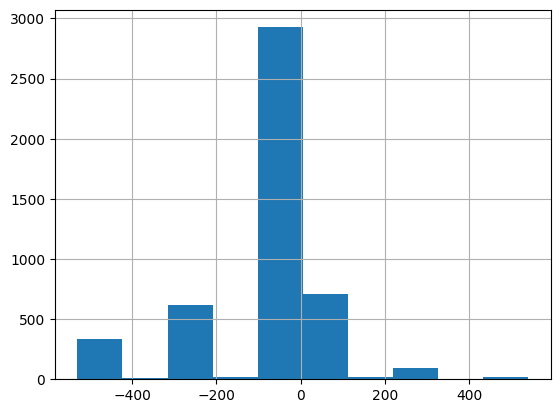

In [7]:
a = np.ravel((prev_t - next_t)[f_1.exog_prev['G_ij']==1])
# pd.DataFrame(a[(a!=0)&(a>-7.5)& (a<7.5)]).hist()
pd.DataFrame(a*60*24).hist()
plt.title('')
plt.savefig('images/simulation_tx_with/Dt_ij.png')
plt.show()

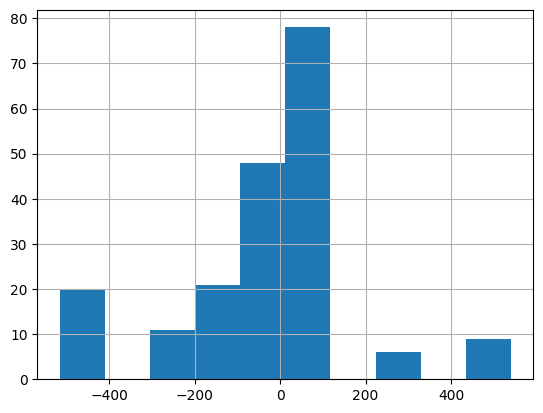

In [9]:
siml_t = pd.read_csv('data/2020/t_ij_sim.csv', dtype={0:str}, index_col=0).to_numpy()
g_ij = f_1.exog_prev['G_ij'].copy()
siml_t_ori = siml_t[[0, 1, 2, 17, 19, 29, 30],:]
next_t_ori = next_t[[0, 1, 2, 17, 19, 29, 30],:]
g_ij_ori = g_ij[[0, 1, 2, 17, 19, 29, 30],:]


a = np.ravel((siml_t_ori - next_t_ori)[g_ij_ori!=0])
pd.DataFrame(a*60*24).hist()
plt.title('')
plt.savefig('images/simulation_tx_without/Dt_ij_ori.png')
plt.show()

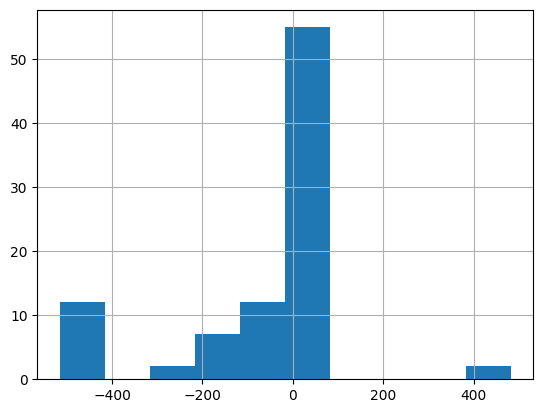

In [10]:
siml_t_dst = siml_t[:,[0, 1, 2, 17, 19, 29, 30]]
next_t_dst = next_t[:,[0, 1, 2, 17, 19, 29, 30]]
g_ij_dst = g_ij[:,[0, 1, 2, 17, 19, 29, 30]]


a = np.ravel((siml_t_dst - next_t_dst)[g_ij_dst!=0])
pd.DataFrame(a*60*24).hist()
plt.title('')
plt.savefig('images/simulation_tx_without/Dt_ij_dst.png')
plt.show()

In [15]:
f_2 = Estimate_params(f_1)

,LX_i,LE_j,Pi_ij,W_ij,t_ij,LPi_ij,LW_ij
0,0,0,0.004536,1.846109,0.003500,-5.395697,0.613080
1,1,0,0.000077,1.864667,0.012458,-9.467403,0.623083
2,2,0,0.000094,1.932810,0.006264,-9.272014,0.658975
3,27,0,0.000028,1.093932,0.375000,-10.495776,0.089779
4,29,0,0.000050,1.423491,0.060097,-9.894686,0.353113
...,...,...,...,...,...,...,...
4740,106,110,0.000022,1.483376,0.055556,-10.710341,0.394321
4741,107,110,0.000532,1.509116,0.036639,-7.538194,0.411524
4742,108,110,0.000248,1.499384,0.031854,-8.300873,0.405054
4743,109,110,0.000164,1.593856,0.027910,-8.715016,0.466156


### Check the regression result ###
                          PanelOLS Estimation Summary                           
Dep. Variable:                 LPi_ij   R-squared:                        0.2280
Estimator:                   PanelOLS   R-squared (Between):             -0.9103
No. Observations:                4745   R-squared (Within):              -0.2450
Date:                Sat, Jan 25 2025   R-squared (Overall):             -0.8660
Time:                        00:27:38   Log-likelihood                   -6892.6
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      1335.6
Entities:                         111   P-value                           0.0000
Avg Obs:                       42.748   Distribution:                  F(1,4523)
Min Obs:                       11.000                                           
Max Obs:                       79.000   F-statistic (robust):            

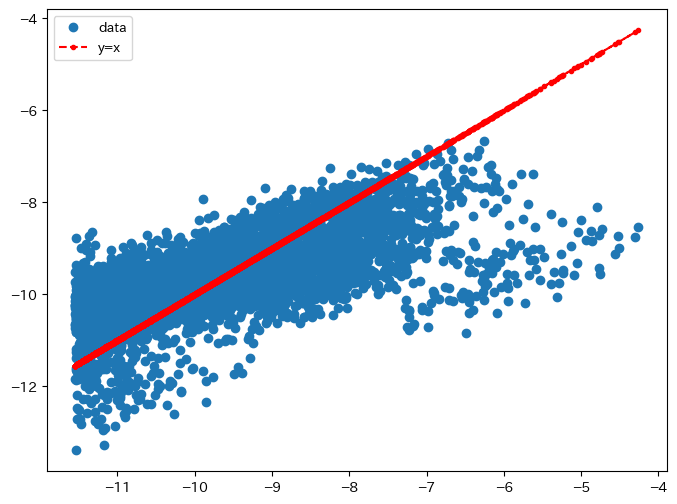

###################################


,LX_i,LE_j,Pi_ij,W_ij,t_ij,LPi_ij,LW_ij
0,0,0,0.006339,1.728514,0.016507,-5.061014,0.547262
1,1,0,0.000191,1.607056,0.020833,-8.565003,0.474404
2,2,0,0.000319,1.917142,0.020833,-8.050620,0.650835
3,10,0,0.000013,1.078807,0.375000,-11.283084,0.075855
4,17,0,0.000012,1.343384,0.038597,-11.331855,0.295192
...,...,...,...,...,...,...,...
4868,106,110,0.000026,1.162621,0.055556,-10.566377,0.150677
4869,107,110,0.000591,1.142566,0.082722,-7.433245,0.133277
4870,108,110,0.000337,1.171671,0.039951,-7.994594,0.158431
4871,109,110,0.000212,1.265792,0.030236,-8.459221,0.235698


### Check the regression result ###
                          PanelOLS Estimation Summary                           
Dep. Variable:                 LPi_ij   R-squared:                        0.2482
Estimator:                   PanelOLS   R-squared (Between):             -0.3475
No. Observations:                4873   R-squared (Within):               0.1295
Date:                Sat, Jan 25 2025   R-squared (Overall):             -0.3157
Time:                        00:27:39   Log-likelihood                   -6908.8
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      1535.6
Entities:                         111   P-value                           0.0000
Avg Obs:                       43.901   Distribution:                  F(1,4651)
Min Obs:                       16.000                                           
Max Obs:                       78.000   F-statistic (robust):            

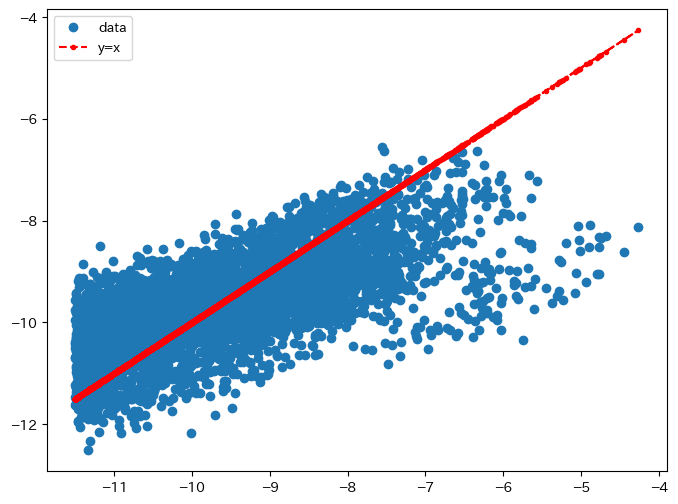

###################################
dlt= 0.1  lmd= 0.1  crit_val= 2.2371368784884114
dlt= 0.1  lmd= 0.10500000000000001  crit_val= 2.278297549618254
dlt= 0.10500000000000001  lmd= 0.1  crit_val= 2.3064421737969534
dlt= 0.095  lmd= 0.10500000000000001  crit_val= 2.210795398478944
dlt= 0.09000000000000002  lmd= 0.10749999999999998  crit_val= 2.166788168202193
dlt= 0.09000000000000002  lmd= 0.10249999999999998  crit_val= 2.1353109944378286
dlt= 0.08500000000000002  lmd= 0.10124999999999995  crit_val= 2.0780093582260544
dlt= 0.07500000000000004  lmd= 0.10874999999999993  crit_val= 2.0275190620207124
dlt= 0.06250000000000006  lmd= 0.11312499999999986  crit_val= 1.9594747599785762
dlt= 0.05750000000000005  lmd= 0.10687499999999983  crit_val= 1.9164063069893187
dlt= 0.041250000000000064  lmd= 0.10656249999999978  crit_val= 1.8603224860264644
dlt= 0.0187500000000001  lmd= 0.1184374999999997  crit_val= 1.8308968555032619
dlt= 0.0  lmd= 0.1270312499999996  crit_val= 1.8980234937474565
dlt= 0.0  

/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Estimate_params.py:163: OptimizeWarning: Unknown solver options: maxfun, maxls
  results = opt.minimize(


dlt= 0.0037500000000001074  lmd= 0.11468749999999965  crit_val= 1.7984448974413219
dlt= 0.0  lmd= 0.11343749999999961  crit_val= 1.87840546852895
dlt= 0.0  lmd= 0.12218749999999959  crit_val= 1.8908900623901967
dlt= 0.008750000000000103  lmd= 0.11468749999999966  crit_val= 1.7899527798901487
dlt= 0.008750000000000096  lmd= 0.10968749999999969  crit_val= 1.7846885224482176
dlt= 0.011250000000000086  lmd= 0.10468749999999971  crit_val= 1.7891626942894299
dlt= 0.013750000000000092  lmd= 0.1096874999999997  crit_val= 1.804026090059906
dlt= 0.0062500000000001036  lmd= 0.11343749999999966  crit_val= 1.7826030008330849
dlt= 0.0062500000000000975  lmd= 0.10843749999999969  crit_val= 1.7782202025023648
dlt= 0.005000000000000095  lmd= 0.1053124999999997  crit_val= 1.7793453756198514
dlt= 0.0037500000000001057  lmd= 0.11218749999999966  crit_val= 1.796226206648686
dlt= 0.007500000000000099  lmd= 0.11031249999999967  crit_val= 1.7812756042985278
dlt= 0.0075000000000000925  lmd= 0.1053124999999997 

In [16]:
f_2.run_eps_prev('OLS')
f_2.run_eps_next('OLS')
# f_2.merge_eps()
f_2.param['gam*eps'] = 11.5
f_2.param['epsilon'] = 30.8
f_2.run_lmd_dlt()
f_2.run_eta_rho()
print(f_2.param)

In [17]:
# f_2.param['gam*eps'] = 11.5
# f_2.param['epsilon'] = 30.8
# f_2.param['lambda'] = 0.043
# f_2.param['delta'] = 0.0077
# f_2.param['eta'] = 0.04
# f_2.param['rho'] = 0.0014
# f_2.param['lambda'] = 0.07
# f_2.param['delta'] = 0.35
# f_2.param['eta'] = 0.15
# f_2.param['rho'] = 0.75

f_2.recover_fundamentals_next()
f_2.recover_fundamentals_prev()

### Check the estimation result ###
A_j


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,1.205046,1.439029,0.93325,1.613515,1.648137,1.571186,1.444123,1.305966,1.653588,1.290575,...,1.538483,1.765365,1.900623,1.782505,1.5882,1.432685,1.303325,1.389291,1.610197,1.225405


B_i


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.734473,0.741185,0.700309,0.877148,0.870364,0.843687,0.853405,0.803924,0.836229,0.817874,...,0.866803,0.839908,0.841738,0.855753,0.839175,0.80918,0.867955,0.818071,0.780929,0.79672


XE_ij


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,1.171628e-05,4.442934e-08,1.331240e-06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
1,8.145346e-07,4.303099e-07,1.626022e-06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
2,1.791167e-07,1.711592e-08,6.394176e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
3,0.000000e+00,0.000000e+00,0.000000e+00,0.001378,0.000035,0.000030,0.000109,0.000089,0.000004,0.001144,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
4,0.000000e+00,0.000000e+00,0.000000e+00,0.000155,0.000197,0.000057,0.000012,0.000016,0.000017,0.000025,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,1.900895e-06,0.000026,1.045710e-04,0.000008,0.000005,0.000003,0.000005
107,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,7.942582e-05,7.671604e-06,1.515829e-06,6.330553e-06,0.000106,1.456765e-06,0.004852,0.000034,0.000010,0.000128
108,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.767641e-06,3.552644e-07,4.320558e-07,5.435606e-07,0.000013,1.834531e-06,0.000054,0.000192,0.000005,0.000055
109,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,4.895920e-07,0.000000e+00,1.039815e-07,6.963891e-08,0.000002,1.157674e-06,0.000014,0.000007,0.000018,0.000014


Pi_est_ij


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.006339,0.000110,0.000242,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000191,0.000861,0.000168,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000319,0.000223,0.000557,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.009228,0.001049,0.000471,0.000045,0.000052,0.000147,0.000360,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.001148,0.007422,0.001266,0.000088,0.000147,0.000656,0.000114,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,0.000222,0.001183,0.003189,0.000062,0.000056,0.000098,0.000026
107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000097,0.000064,0.000195,0.000037,0.000216,0.000031,0.014062,0.000457,0.000325,0.000591
108,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,0.000025,0.000041,0.000048,0.000042,0.000432,0.000030,0.000353,0.002827,0.000201,0.000337
109,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,0.000015,-0.000000,0.000025,0.000013,0.000147,0.000045,0.000195,0.000189,0.001680,0.000212


ΔPi_est_ij (%)


/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Estimate_params.py:376: RuntimeWarning: invalid value encountered in divide
  display(pd.DataFrame((Pi_est_ij-Pi_ij)/Pi_ij*100))


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.000004,0.000004,0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.000004,0.000004,0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.000004,0.000004,0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004
107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004
108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004
109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000004,NaN,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004


ΣPi_est_ij
1.0
###################################


### Check the estimation result ###
A_j


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,1.452445,1.660301,1.356025,1.787155,1.997328,2.129691,1.99437,1.791044,1.870898,1.666001,...,1.738661,2.02828,2.427866,2.291492,2.015497,1.973213,1.803719,1.790883,1.965559,1.701416


B_i


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.69359,0.703261,0.643861,0.855908,0.864856,0.848175,0.863328,0.816788,0.829498,0.829968,...,0.845023,0.829152,0.828162,0.825418,0.821122,0.803245,0.839885,0.810163,0.775983,0.792647


XE_ij


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,3.932946e-06,3.139178e-09,6.416078e-09,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
1,5.976449e-08,4.831696e-08,3.615181e-09,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
2,4.808843e-08,3.465890e-09,3.056833e-08,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00,0.000000e+00,0.000143,0.000005,0.000002,2.168408e-07,3.122763e-07,2.711365e-07,0.000005,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
4,0.000000e+00,0.000000e+00,0.000000e+00,0.000019,0.000062,0.000005,6.357626e-07,8.297377e-07,1.443675e-06,0.000002,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,6.013863e-07,5.786072e-06,1.381860e-05,0.000001,8.006759e-07,3.869428e-07,2.394239e-07
107,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,3.201814e-06,3.159663e-07,1.863365e-07,8.172685e-08,1.342782e-06,2.553234e-07,0.000157,6.030584e-06,1.264333e-06,4.686996e-06
108,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,7.112574e-07,1.464644e-07,5.934990e-08,1.669812e-07,3.639637e-06,2.476893e-07,0.000006,3.778113e-05,9.754894e-07,2.354942e-06
109,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,2.731318e-07,2.108324e-08,1.684257e-08,3.249945e-08,5.909489e-07,1.285139e-07,0.000002,1.453013e-06,3.880858e-06,7.708202e-07


Pi_est_ij


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.004536,0.000029,0.000034,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000077,0.000723,0.000029,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000094,0.000074,0.000305,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
3,0.000000,0.000000,0.000000,0.008775,0.000840,0.000344,0.000035,0.000048,0.000070,0.000239,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,-0.000000,0.000000,-0.000000,0.000979,0.007145,0.001064,0.000079,0.000129,0.000393,0.000074,...,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,0.000228,0.001170,0.003240,0.000050,0.000060,0.000085,0.000022
107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000100,0.000071,0.000138,0.000029,0.000188,0.000031,0.013521,0.000479,0.000241,0.000532
108,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000022,0.000036,0.000036,0.000045,0.000492,0.000034,0.000349,0.003489,0.000191,0.000248
109,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000013,0.000010,0.000017,0.000014,0.000150,0.000041,0.000166,0.000214,0.001660,0.000164


ΔPi_est_ij (%)


/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Estimate_params.py:376: RuntimeWarning: invalid value encountered in divide
  display(pd.DataFrame((Pi_est_ij-Pi_ij)/Pi_ij*100))


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,-0.000004,-0.000004,-0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.000004,-0.000004,-0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-0.000004,-0.000004,-0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004
107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004
108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004
109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004,-0.000004


ΣPi_est_ij
1.0
###################################


In [17]:
f_3 = Solve_equilibrium(f_2)
f_3.check_replication_next('minimize', 'Nelder-Mead', 10**4, ratio=10) # 10**5で15分, 10*6で1時間半, 10*7で3時間

iteration:  0 func= 9.915542751530103e-11
iteration:  10000 func= 3.1995893845178766e-06
### Check the result of equilibrium ###
       message: Maximum number of iterations has been exceeded.
       success: False
        status: 2
           fun: 9.915542751530103e-11
             x: [ 8.538e-01  1.043e+00 ...  3.951e+04  4.071e+04]
           nit: 10000
          nfev: 13817
 final_simplex: (array([[ 8.538e-01,  1.043e+00, ...,  3.951e+04,
                         4.071e+04],
                       [ 8.538e-01,  1.043e+00, ...,  3.951e+04,
                         4.072e+04],
                       ...,
                       [ 8.538e-01,  1.043e+00, ...,  3.951e+04,
                         4.072e+04],
                       [ 8.538e-01,  1.043e+00, ...,  3.951e+04,
                         4.072e+04]]), array([ 9.916e-11,  1.438e-07, ...,  2.990e-07,  2.993e-07]))
w_j: 賃金率


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.853833,1.0429,0.771533,0.7848,0.914492,0.866084,0.791,0.8197,0.922967,0.7506,...,0.821367,1.006567,1.0086,0.991667,0.8823,0.837033,0.753945,0.794767,0.8862,0.736333


q_i: 居住地地価


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.193,0.284333,0.11,0.698333,0.784917,0.548083,0.569,0.380333,0.899333,0.459333,...,0.789667,0.845333,0.686333,0.678333,0.628,0.641,0.528,0.625,0.519667,0.509667


N_R_i: 居住人口


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,75320.006379,21048.986212,14536.999657,231828.998197,215980.992552,174378.034074,110832.971684,74159.006438,37112.999763,89414.006602,...,85154.934246,87643.991323,62384.002373,58293.008478,157662.983067,76144.008356,249959.004116,80085.01623,39509.972633,40713.985922


ΔN_R_i: 居住人口の差


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,-0.002636,-0.000737,-0.000509,-0.008114,-0.007559,-0.006103,-0.003879,-0.002596,-0.001299,-0.003129,...,-0.00298,-0.003068,-0.002183,-0.00204,-0.005518,-0.002665,-0.008749,-0.002803,-0.001383,-0.001425


#######################################
### Calculate the endogenous variables ###
π_ij: 通勤割合


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.006339,0.000110,0.000242,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
1,0.000191,0.000861,0.000168,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
2,0.000319,0.000223,0.000557,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
3,-0.000000,-0.000000,-0.000000,0.009228,0.001049,0.000471,0.000045,0.000052,0.000147,0.000360,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
4,0.000000,0.000000,0.000000,0.001148,0.007422,0.001266,0.000088,0.000147,0.000656,0.000114,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,0.000222,0.001183,0.003189,0.000062,0.000056,0.000098,0.000026
107,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,0.000097,0.000064,0.000195,0.000037,0.000216,0.000031,0.014062,0.000457,0.000325,0.000591
108,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,0.000025,0.000041,0.000048,0.000042,0.000432,0.000030,0.000353,0.002827,0.000201,0.000337
109,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,0.000015,-0.000000,0.000025,0.000013,0.000147,0.000045,0.000195,0.000189,0.001680,0.000212


ΔPi_est_ij (%)


/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Solve_equilibrium.py:328: RuntimeWarning: invalid value encountered in divide
  display(pd.DataFrame((Pi_ij-self.given_ref['Pi_ij'])/self.given_ref['Pi_ij']*100))


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.000003,0.000003,0.000003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.000004,0.000004,0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.000004,0.000004,0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004
107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004
108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000004,0.000003,0.000004,0.000004,0.000004,0.000004,0.000003,0.000004,0.000004,0.000004
109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000003,NaN,0.000004,0.000003,0.000003,0.000003,0.000003,0.000004,0.000003,0.000004


#####################################


In [10]:
f_3.check_replication_prev('minimize', 'Nelder-Mead', 10**4, ratio=10) # 10**5で15分, 10*6で1時間半, 10*7で3時間

iteration:  0 func= 1.3362187109615236e-12


KeyboardInterrupt: 

In [18]:
f_3 = Solve_equilibrium(f_2)
# set the new exogenous variables
new_exog = {}
new_exog['N'] = f_2.exog_next['N']
new_exog['t_ij'] = f_2.exog_next['t_ij']
new_exog['tau_ij'] = f_2.exog_next['tau_ij']
f_3.simulate_new_exog_prev(new_exog, 'minimize', 'Nelder-Mead', 10**5, ratio=10)

# ファイルに保存
dirname = 'simulation_tx_with'
res = f_3.res_prev
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S") # 現在時刻を取得
with open(f"results/{dirname}/{timestamp}.pkl", "wb") as f: pickle.dump(res, f)

iteration:  0 func= 6.466438686350572e+63


/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Solve_equilibrium.py:103: RuntimeWarning: invalid value encountered in power
  A_j = al_j*Ups_j**lmd


KeyboardInterrupt: 

In [30]:
df_sim_t_ij.to_numpy()-f_2.exog_next['t_ij']

array([[-0.013007, -0.028598, -0.014264, ...,  0.      ,  0.      ,
         0.      ],
       [-0.008375,  0.003437, -0.01359 , ...,  0.      ,  0.      ,
         0.      ],
       [-0.014569, -0.013347,  0.012604, ...,  0.      ,  0.      ,
         0.      ],
       ...,
       [ 0.      ,  0.      ,  0.      , ..., -0.006709,  0.      ,
        -0.008097],
       [ 0.      ,  0.      ,  0.      , ...,  0.      , -0.000764,
        -0.002326],
       [ 0.      ,  0.      ,  0.      , ..., -0.000792, -0.002549,
        -0.004805]])

In [9]:
f_3 = Solve_equilibrium(f_2)
# set the new exogenous variables
df_sim_t_ij = pd.read_csv('data/2020/t_ij_sim.csv', dtype={0:str}, index_col=0)
new_exog = {}
new_exog['N'] = f_2.exog_next['N']
new_exog['t_ij'] = df_sim_t_ij.to_numpy()
new_exog['tau_ij'] = f_2.exog_next['tau_ij']
f_3.simulate_new_exog_prev(new_exog, 'minimize', 'Nelder-Mead', 10**6, ratio=10)

# ファイルに保存
dirname = 'simulation_tx_without'
res = f_3.res_prev
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S") # 現在時刻を取得
with open(f"results/{dirname}/{timestamp}.pkl", "wb") as f: pickle.dump(res, f)

iteration:  0 func= 5.5738511141770015
iteration:  10000 func= 0.2778162748051044
iteration:  20000 func= 0.14659646169537932
iteration:  30000 func= 0.07208957129700386
iteration:  40000 func= 0.015791849321428426
iteration:  50000 func= 0.0026585930091663334
iteration:  60000 func= 0.0007301204065157488
iteration:  70000 func= 0.000556968165630225
iteration:  80000 func= 0.0005383329222089282
iteration:  90000 func= 0.0005338343978998377
iteration:  100000 func= 0.0005222440210906835
iteration:  110000 func= 0.000489460616201637
iteration:  120000 func= 0.00043243528644785193
iteration:  130000 func= 0.0003567983398273074
iteration:  140000 func= 0.00030120040107626904
iteration:  150000 func= 0.00028864667074903426
iteration:  160000 func= 0.00028465296241646747
iteration:  170000 func= 0.0002837473009317446
iteration:  180000 func= 0.00028345581369658825
iteration:  190000 func= 0.00028320037597806747
iteration:  200000 func= 0.0002822086298281926
iteration:  210000 func= 0.0002797

,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.974714,1.23955,1.149794,0.96187,1.064849,1.089175,1.101261,1.099722,1.132402,0.936533,...,0.943311,1.172822,1.281586,1.208393,1.0912,1.113026,1.008656,1.022369,1.126527,1.052685


q_i: 居住地地価


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.301732,0.273351,0.199849,0.665408,0.791204,0.62995,0.672653,0.510538,0.801621,0.635298,...,0.862439,0.913117,0.836019,0.794509,0.780422,0.765856,0.739184,0.756753,0.672394,0.709935


N_R_i: 居住人口


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,48574.011492,12075.358926,5998.744906,197365.193003,228976.149253,189564.379201,125185.372489,80098.435242,34599.680141,88663.810788,...,85490.605148,90380.137315,63413.987285,64688.109487,145413.264026,77824.916709,248913.726252,80252.390068,40598.954237,44546.072634


ΔN_R_i: 居住人口の差


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,607.826146,-968.632567,-167.232907,2322.790971,19026.778588,7029.921097,4440.068968,1625.798883,1283.749687,-15071.019757,...,-345.803181,3333.385027,7633.810162,4312.264768,-4490.699491,-936.478218,10324.17652,-6330.800047,1143.019764,-2631.770962


#######################################
### Calculate the endogenous variables ###
π_ij: 通勤割合


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.004640,0.000029,0.000032,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
1,0.000083,0.000757,0.000029,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
2,0.000102,0.000077,0.000307,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
3,-0.000000,-0.000000,-0.000000,0.009158,0.000736,0.000350,0.000036,0.000050,0.000073,0.000233,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
4,0.000000,0.000000,0.000000,0.000884,0.008793,0.000944,0.000101,0.000116,0.000366,0.000062,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,0.000259,0.001155,0.003554,0.000080,0.000060,0.000085,0.000023
107,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,0.000104,0.000074,0.000143,0.000029,0.000185,0.000046,0.014161,0.000495,0.000246,0.000555
108,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,0.000023,0.000041,0.000038,0.000047,0.000496,0.000034,0.000367,0.003612,0.000198,0.000260
109,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000015,0.000010,0.000019,0.000019,0.000152,0.000041,0.000177,0.000225,0.001710,0.000172


ΔPi_est_ij (%)


/Users/nagampere/File/horkew/analysis/master_thesis/libs_QSM/Solve_equilibrium.py:328: RuntimeWarning: invalid value encountered in divide
  display(pd.DataFrame((Pi_ij-self.given_ref['Pi_ij'])/self.given_ref['Pi_ij']*100))


,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,2.289147,-1.991975,-5.395352,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,7.926970,4.659503,0.844167,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,8.088409,4.478507,0.513646,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,4.358899,-12.349440,1.933484,3.044917,3.168113,3.607852,-2.347714,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,-9.678940,23.066417,-11.275644,26.654700,-10.050876,-6.843945,-15.935437,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,13.805312,-1.294770,9.662415,61.139448,-0.005794,0.042640,1.360330
107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.219891,4.671853,3.372206,0.552876,-1.171997,47.651030,4.736713,3.212921,1.956430,4.159373
108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.957030,12.272748,4.009995,5.116550,0.989146,-0.827333,5.286330,3.517376,3.474545,4.896987
109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,17.105571,4.964519,12.789119,34.393238,1.352322,-0.244767,6.914263,5.074020,3.052401,4.848896


#####################################


In [26]:
dirname = 'simulation_tx_without'
data = '20250123_083134' # 10**6 推定params 0.05,0.02
with open(f"results/{dirname}/{data}.pkl", "rb") as f: res = pickle.load(f)

pd.DataFrame(res['Pi_ij'])

,0,1,2,3,4,5,6,7,8,9,...,101,102,103,104,105,106,107,108,109,110
0,0.004640,0.000029,0.000032,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
1,0.000083,0.000757,0.000029,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
2,0.000102,0.000077,0.000307,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
3,-0.000000,-0.000000,-0.000000,0.009158,0.000736,0.000350,0.000036,0.000050,0.000073,0.000233,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
4,0.000000,0.000000,0.000000,0.000884,0.008793,0.000944,0.000101,0.000116,0.000366,0.000062,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,0.000259,0.001155,0.003554,0.000080,0.000060,0.000085,0.000023
107,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,0.000104,0.000074,0.000143,0.000029,0.000185,0.000046,0.014161,0.000495,0.000246,0.000555
108,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,0.000023,0.000041,0.000038,0.000047,0.000496,0.000034,0.000367,0.003612,0.000198,0.000260
109,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000015,0.000010,0.000019,0.000019,0.000152,0.000041,0.000177,0.000225,0.001710,0.000172


In [ ]:
f_3 = Solve_equilibrium(f_2)
# set the new param
new_param = f_3.param
new_param['mu_room'] = 0.03
f_3.simulate_new_param(new_param, 'minimize', 'Nelder-Mead', 10**5)

In [5]:
from libs_QSM.Plot_gdf import plot_gdf
from libs_QSM.Plot_gdf_tx import plot_gdf_tx
import os
import geopandas as gpd
import numpy as np

gdf = gpd.read_file(os.path.join(os.getcwd(), 'data/setup_2000_2020/jcode.geojson'), dtype={'JCODE':str})

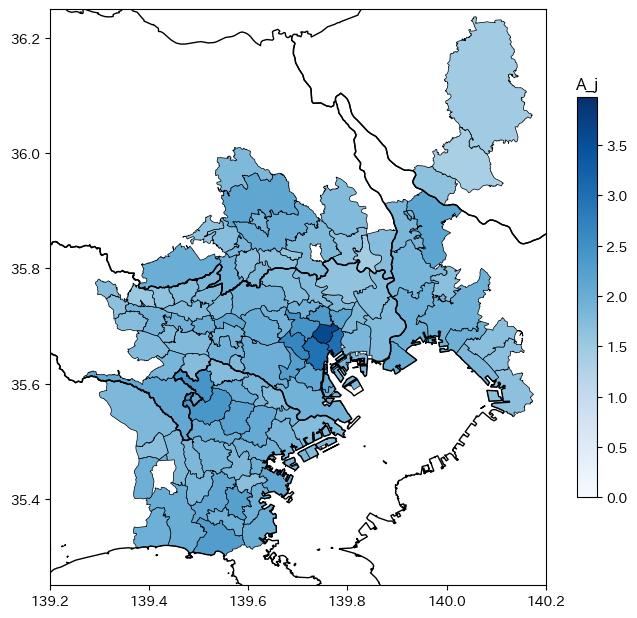

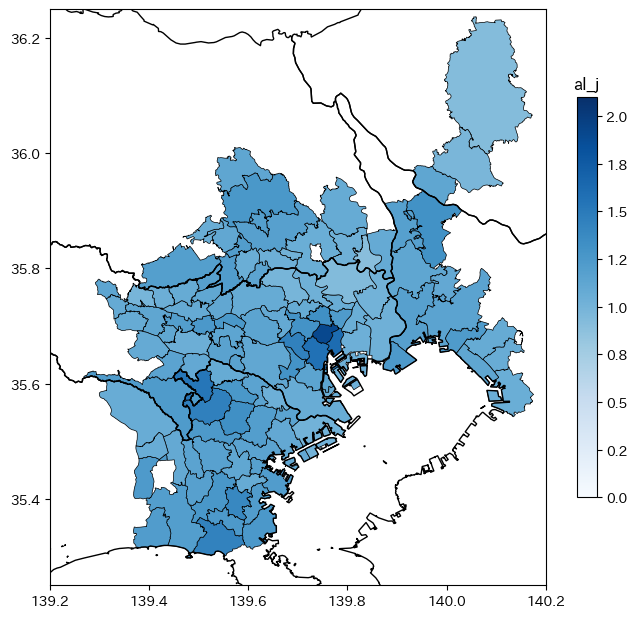

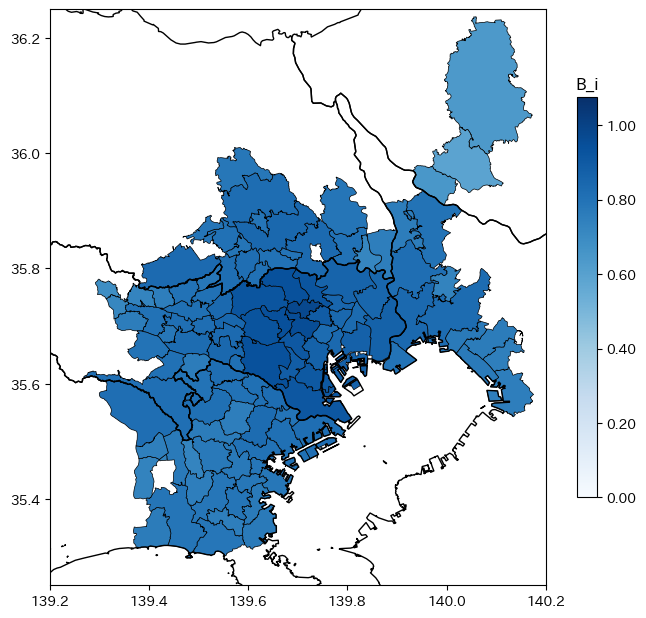

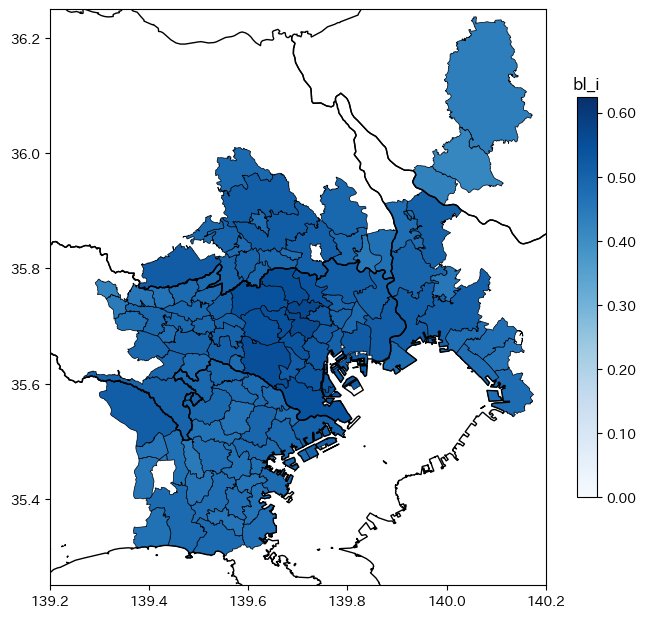

In [27]:
dirname = '2000'
exog = f_2.exog_prev
res_p = f_2.ref_prev
res_n = f_2.ref_next

gdf_vis =     gdf.merge(pd.DataFrame({'jcode':jcode,'A_j':res_p['A_j']}), on='jcode', how='left')
gdf_vis = gdf_vis.merge(pd.DataFrame({'jcode':jcode,'al_j':exog['al_j']}), on='jcode', how='left')
gdf_vis = gdf_vis.merge(pd.DataFrame({'jcode':jcode,'B_i':res_p['B_i']}), on='jcode', how='left')
gdf_vis = gdf_vis.merge(pd.DataFrame({'jcode':jcode,'bl_i':exog['bl_i']}), on='jcode', how='left')

plot_gdf(gdf_vis, dirname, 'A_j', '', '{x:,.1f}')
plot_gdf(gdf_vis, dirname, 'al_j', '', '{x:,.1f}')
plot_gdf(gdf_vis, dirname, 'B_i', '', '{x:,.2f}')
plot_gdf(gdf_vis, dirname, 'bl_i', '', '{x:,.2f}')

子供の総数(2000年):  3177377.221718899
子供の総数(2020年):  3326439.5474385065
2020年と2000年の差:  149062.32571960753


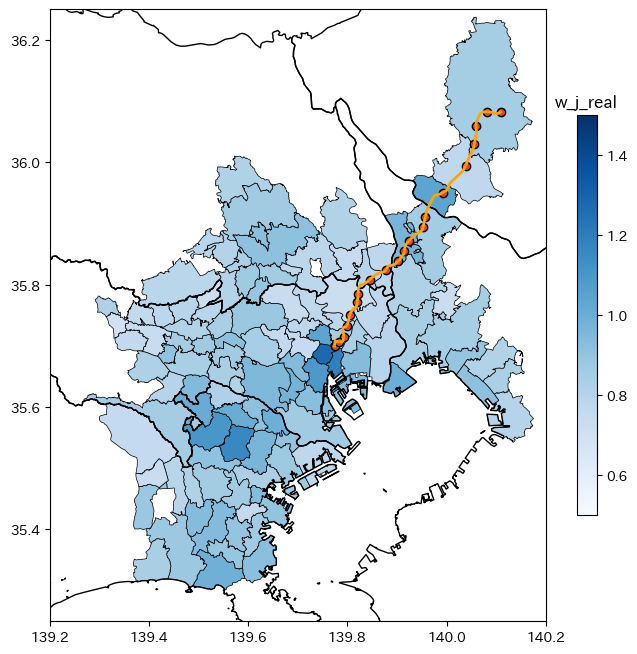

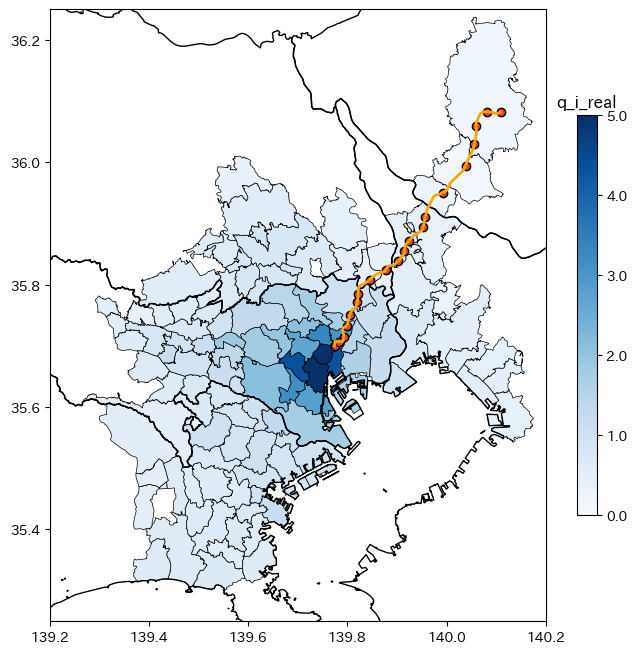

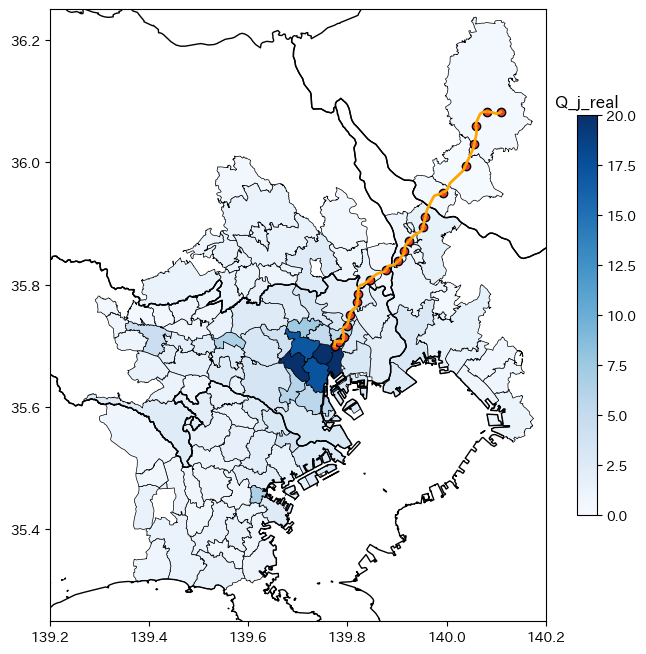

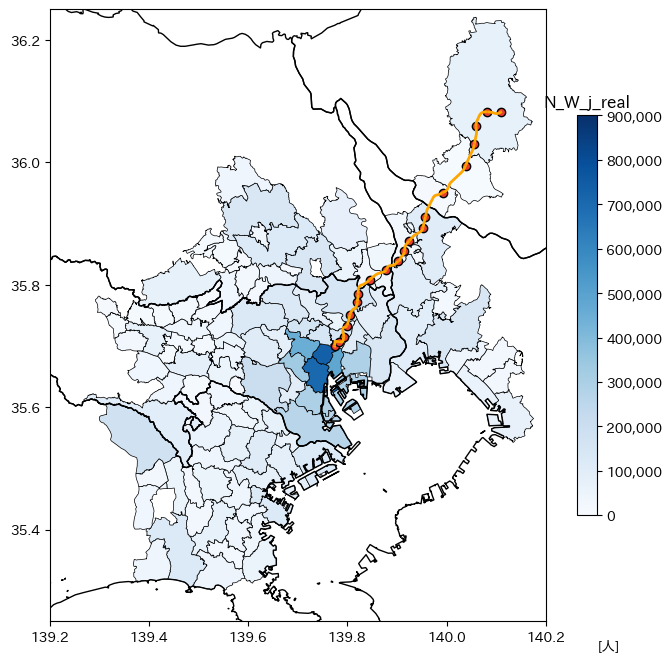

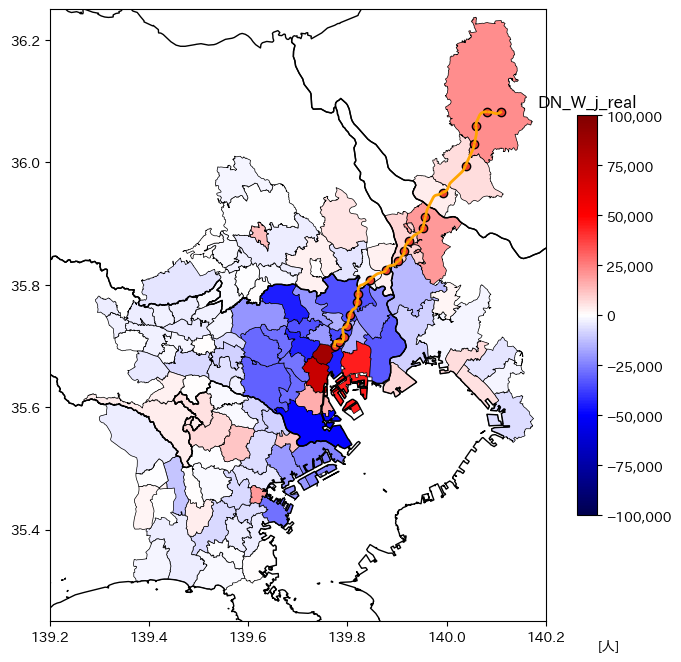

...

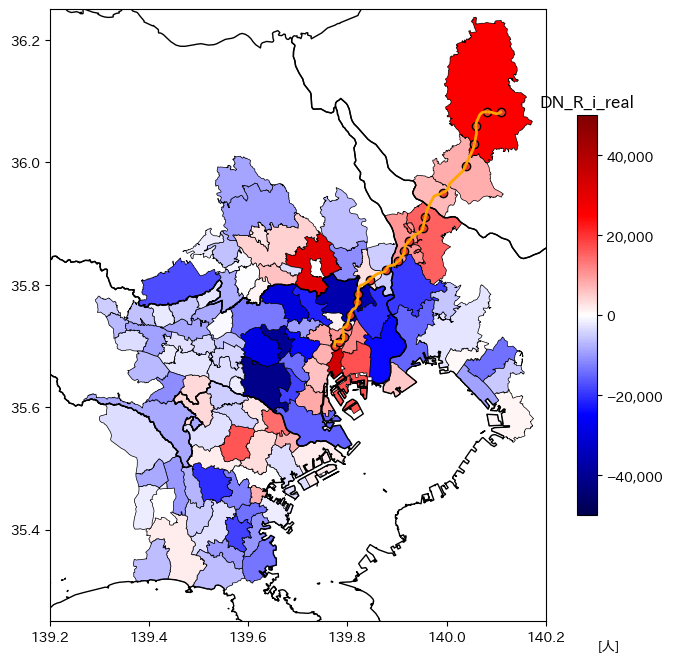

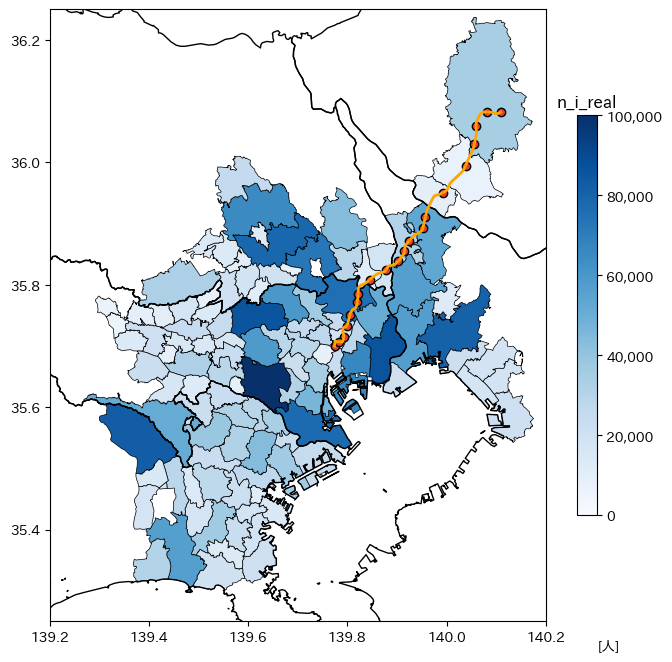

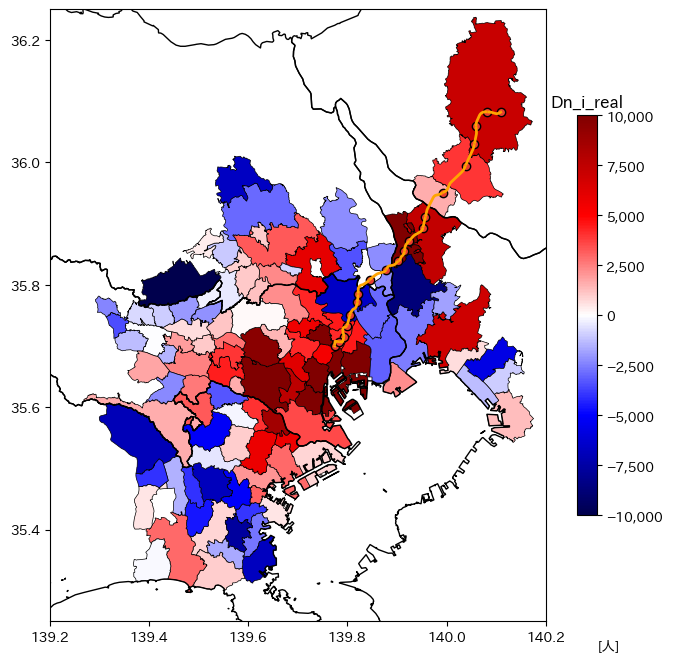

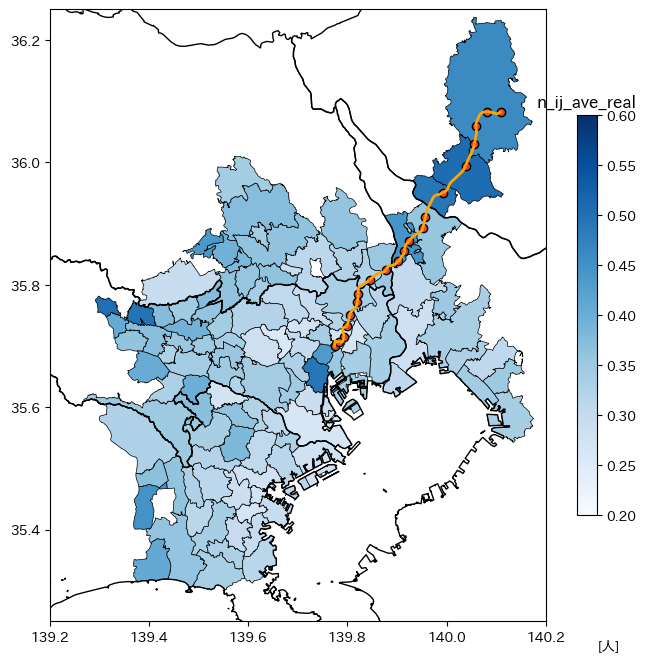

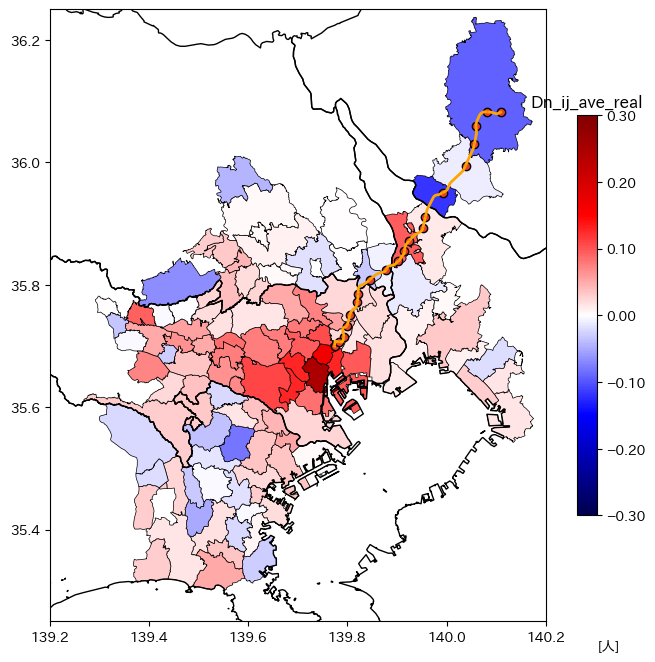

In [10]:
# difference
dirname = 'difference_2000_2020'
N_p = f_1.exog_prev['N']
N_n = f_1.exog_next['N']
res_p = f_1.ref_prev
res_n = f_1.ref_next

print('子供の総数(2000年): ', np.sum(res_p['n_i']))
print('子供の総数(2020年): ', np.sum(N_n*res_n['Pi_ij']*res_n['n_ij']))
print('2020年と2000年の差: ', np.sum(N_n*res_n['Pi_ij']*res_n['n_ij'])-np.sum(res_p['n_i']))

df_ij_real = pd.DataFrame({
    'jcode': jcode,
    'Dn_i_real': np.sum(N_n*res_n['Pi_ij']*res_n['n_ij'], axis=1)-np.sum(N_p*res_p['Pi_ij']*res_p['n_ij'], axis=1),
    'Dn_j_real': np.sum(N_n*res_n['Pi_ij']*res_n['n_ij'], axis=0)-np.sum(N_p*res_p['Pi_ij']*res_p['n_ij'], axis=0),
    'H_R_ij_ave_real': np.sum(res_n['H_R_ij']*N_n*res_n['Pi_ij'], axis=1)/res_n['N_R_i'],
    'DH_R_ij_ave_real': np.sum(res_n['H_R_ij']*N_n*res_n['Pi_ij'], axis=1)/res_n['N_R_i'] - np.sum(res_p['H_R_ij']*N_p*res_p['Pi_ij'], axis=1)/res_p['N_R_i'],
    'n_ij_ave_real': np.sum(N_n*res_n['Pi_ij']*res_n['n_ij'], axis=1)/res_n['N_R_i'],
    'Dn_ij_ave_real': np.sum(N_n*res_n['Pi_ij']*res_n['n_ij'], axis=1)/res_n['N_R_i'] - np.sum(N_p*res_p['Pi_ij']*res_p['n_ij'], axis=1)/res_p['N_R_i'],
})
gdf_vis_dif =         gdf.merge(pd.DataFrame({'jcode':jcode,'N_R_i_real':res_n['N_R_i']}), on='jcode', how='left')
gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'DN_R_i_real':res_n['N_R_i']-res_p['N_R_i']}), on='jcode', how='left')
gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'N_W_j_real':res_n['N_W_j']}), on='jcode', how='left')
gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'DN_W_j_real':res_n['N_W_j']-res_p['N_W_j']}), on='jcode', how='left')
gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'n_i_real':res_n['n_i']}), on='jcode', how='left')
gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'n_j_real':np.sum(N_n*res_n['Pi_ij']*res_n['n_ij'], axis=0)}), on='jcode', how='left')
# gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'H_R_i_real':res['H_R_i']}), on='jcode', how='left')
# gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'H_R_i_real':res['H_R_i']}), on='jcode', how='left')
# gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'H_R_i_real':res['H_R_i']}), on='jcode', how='left')
# gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'H_W_j_real':res['H_W_j']}), on='jcode', how='left')
# gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'H_i_real':res_n['H_i']}), on='jcode', how='left')
# gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'A_j_real':res_n['A_j']}), on='jcode', how='left')
# gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'B_i_real':res_n['B_i']}), on='jcode', how='left')
gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'q_i_real':res_n['q_i']}), on='jcode', how='left')
gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'Q_j_real':res_n['Q_j']}), on='jcode', how='left')
gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'w_j_real':res_n['w_j']}), on='jcode', how='left')
# gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'Ups_real':res_n['Ups_j']}), on='jcode', how='left')
# gdf_vis_dif = gdf_vis_dif.merge(pd.DataFrame({'jcode':jcode,'Omg_real':res_n['Omega_i']}), on='jcode', how='left')
gdf_vis_dif = gdf_vis_dif.merge(df_ij_real, on='jcode', how='left')

plot_gdf_tx(gdf_vis_dif, dirname, 'w_j_real', '', 0.5, 1.5, '{x:,.1f}')
plot_gdf_tx(gdf_vis_dif, dirname, 'q_i_real', '', 0, 5, '{x:,.1f}')
plot_gdf_tx(gdf_vis_dif, dirname, 'Q_j_real', '', 0, 20, '{x:,.1f}')
plot_gdf_tx(gdf_vis_dif, dirname, 'N_W_j_real', '[人]', 0, 900000, '{x:,.0f}')
plot_gdf_tx(gdf_vis_dif, dirname, 'DN_W_j_real', '[人]', -100000, 100000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_dif, dirname, 'N_R_i_real', '[人]', 0, 400000, '{x:,.0f}')
plot_gdf_tx(gdf_vis_dif, dirname, 'DN_R_i_real', '[人]', -50000, 50000, '{x:,.0f}')
plot_gdf_tx(gdf_vis_dif, dirname, 'n_i_real', '[人]', 0, 100000,'{x:,.0f}')
# plot_gdf_tx(gdf_vis_dif, dirname, 'n_j_real', '[人]', 0, 100000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_dif, dirname, 'Dn_i_real', '[人]', -10000, 10000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_dif, dirname, 'n_ij_ave_real', '[人]', 0.2, 0.6, '{x:,.2f}')
plot_gdf_tx(gdf_vis_dif, dirname, 'Dn_ij_ave_real', '[人]', -0.3, 0.3,'{x:,.2f}')
# plot_gdf_tx(gdf_vis_dif, dirname, 'A_j_real', '', '{x:,.1f}')
# plot_gdf_tx(gdf_vis_dif, dirname, 'B_i_real', '', '{x:,.2f}')
# plot_gdf_tx(gdf_vis_dif, dirname, 'Dn_i_real', '[人]', '{x:,.2f}')
# plot_gdf_tx(gdf_vis_dif, dirname, 'Dn_j_real', '[人]', '{x:,.2f}')
# plot_gdf_tx(gdf_vis_dif, dirname, 'H_R_ij_ave_real', '', '{x:,.5f}')
# plot_gdf_tx(gdf_vis_dif, dirname, 'DH_R_ij_ave_real', '', '{x:,.5f}')

子供の総数の基準値:  3177377.221718899
子供の総数のwith:  3050514.142407875
withと基準値の差:  -126863.07931102393


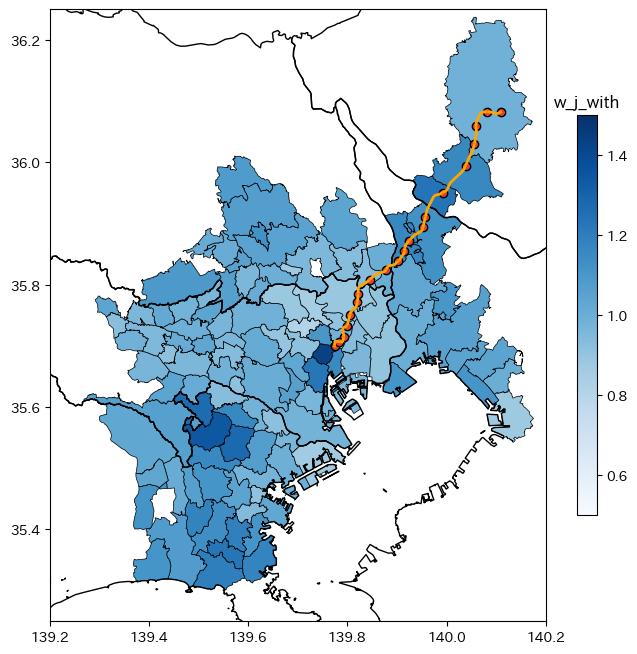

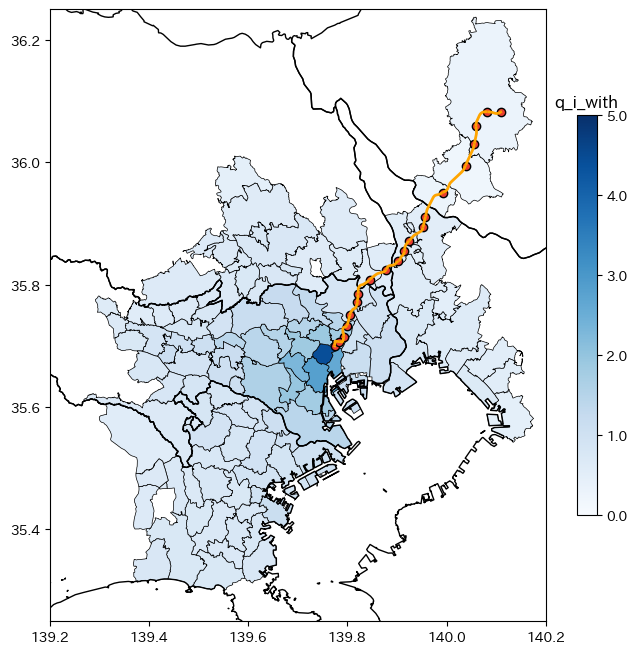

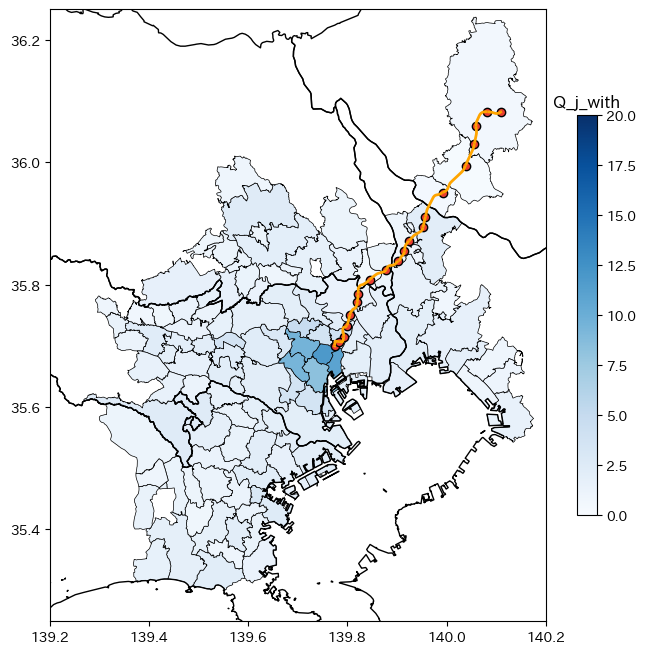

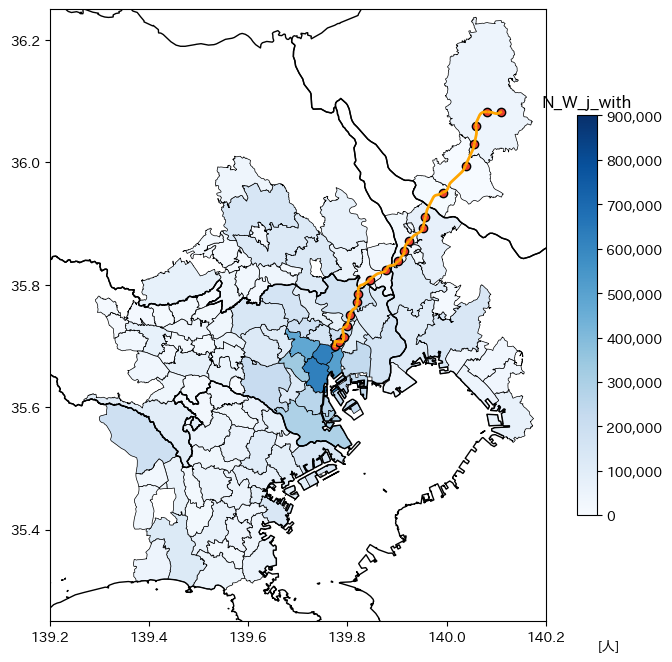

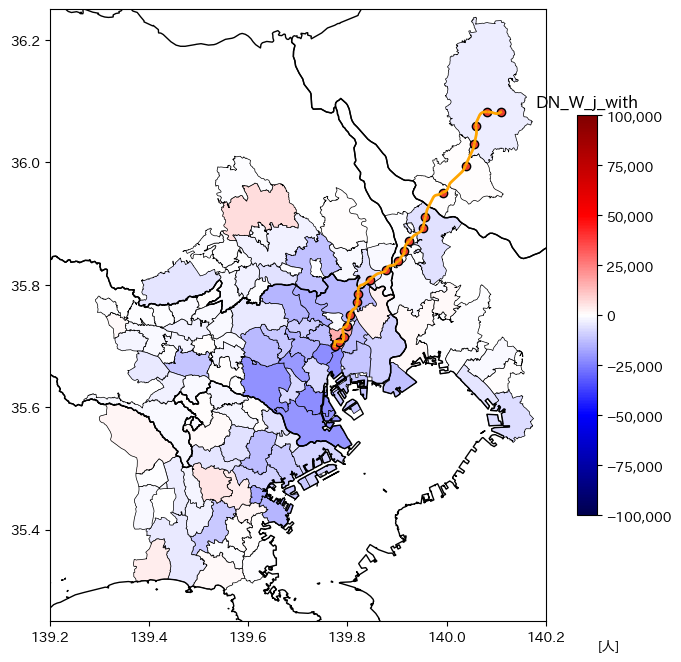

...

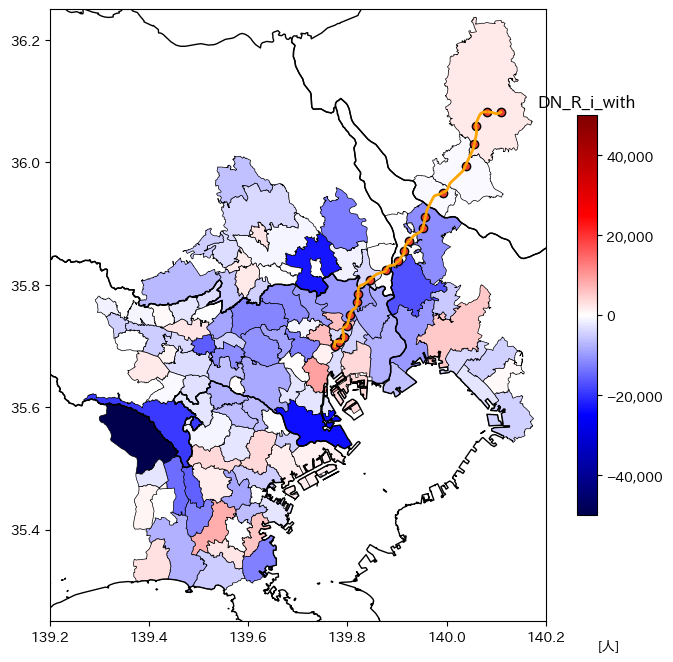

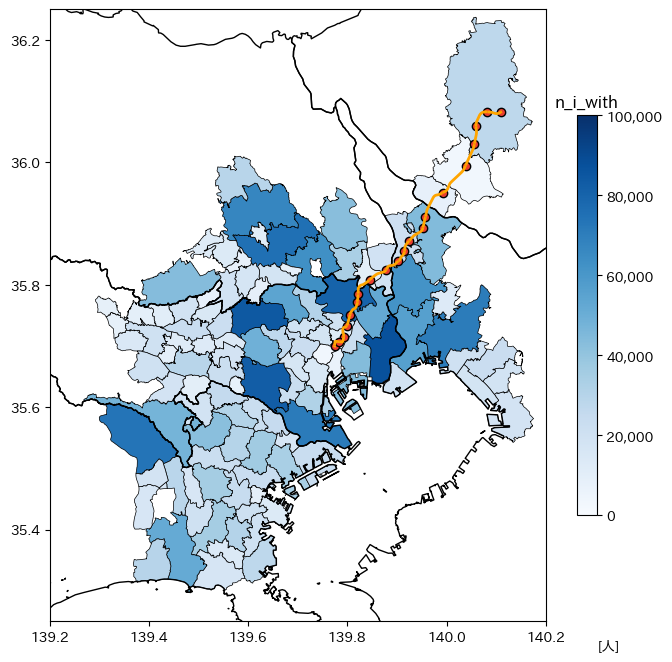

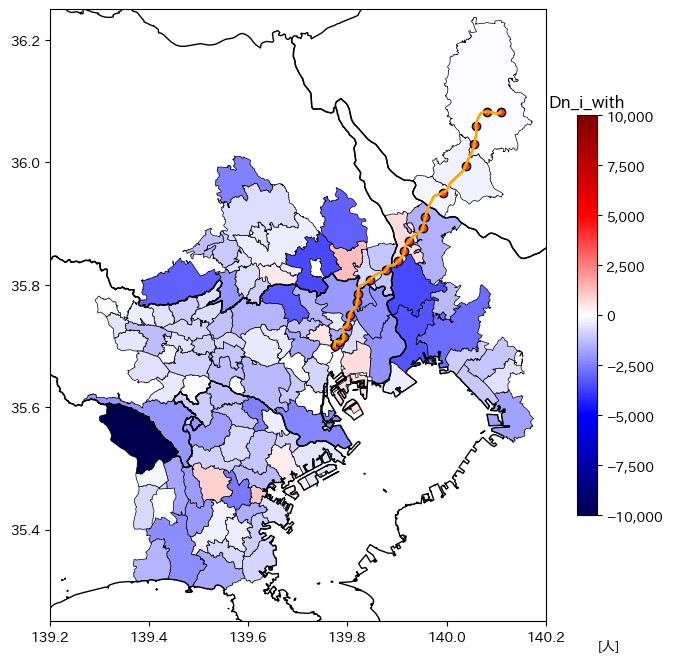

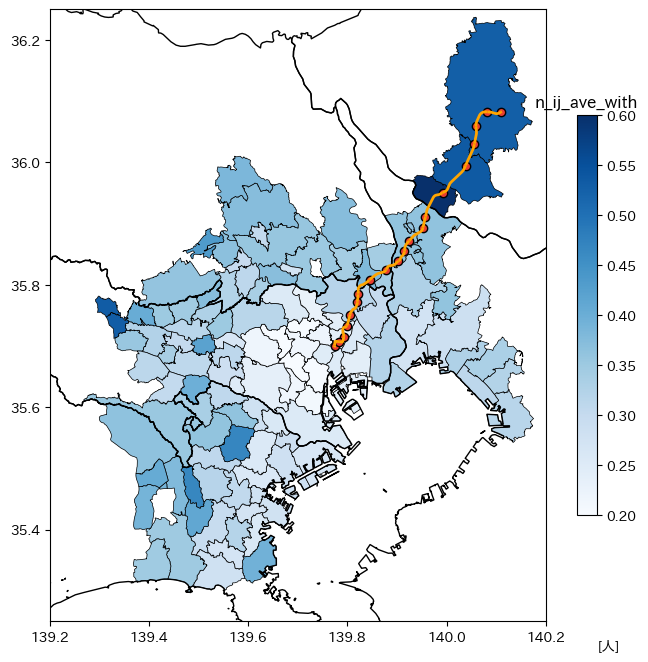

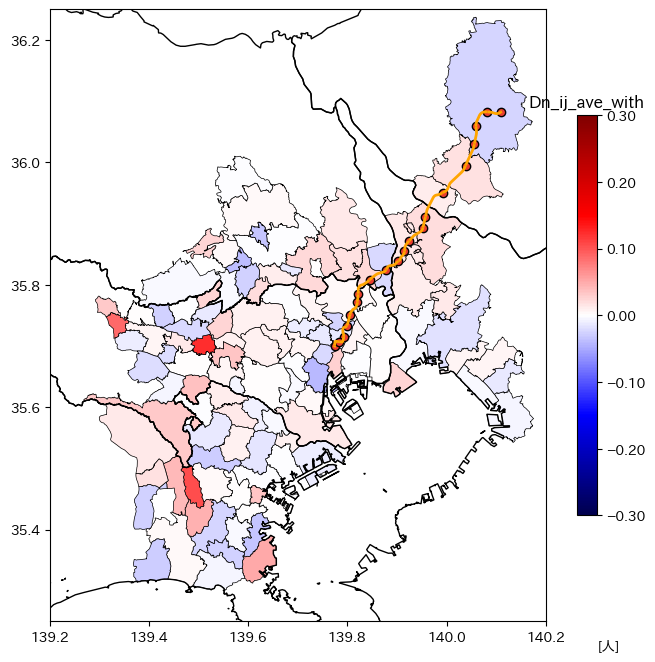

In [11]:
# f_3 simulation
dirname = 'simulation_tx_with'
N_p = f_1.exog_prev['N']
N_n = f_1.exog_next['N']
ref = f_1.ref_prev
# res = f_3.res_prev
data = '20250123_054710' # 10**6 推定params 0.05,0.02
with open(f"results/{dirname}/{data}.pkl", "rb") as f: res = pickle.load(f)

print('子供の総数の基準値: ', np.sum(ref['n_i']))
print('子供の総数のwith: ', np.sum(N_n*res['Pi_ij']*res['n_ij']))
print('withと基準値の差: ', np.sum(N_n*res['Pi_ij']*res['n_ij'])-np.sum(ref['n_i']))

df_ij_with = pd.DataFrame({
    'jcode': jcode,
    'n_i_with': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=1),
    'Dn_i_with': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=1)-np.sum(N_p*ref['Pi_ij']*ref['n_ij'], axis=1),
    'n_j_with': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=0),
    'Dn_j_with': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=0)-np.sum(N_p*ref['Pi_ij']*ref['n_ij'], axis=0),
    'H_R_ij_ave_with': np.sum(res['H_R_ij']*N_n*res['Pi_ij'], axis=1)/res['N_R_i'],
    'DH_R_ij_ave_with': np.sum(res['H_R_ij']*N_n*res['Pi_ij'], axis=1)/res['N_R_i'] - np.sum(ref['H_R_ij']*N_p*ref['Pi_ij'], axis=1)/ref['N_R_i'],
    'n_ij_ave_with': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=1)/res['N_R_i'],
    'Dn_ij_ave_with': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=1)/res['N_R_i'] - np.sum(N_p*ref['Pi_ij']*ref['n_ij'], axis=1)/ref['N_R_i'],
})
gdf_vis_with =         gdf.merge(pd.DataFrame({'jcode':jcode,'N_R_i_with':res['N_R_i']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'DN_R_i_with':res['N_R_i']-ref['N_R_i']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'N_W_j_with':res['N_W_j']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'DN_W_j_with':res['N_W_j']-ref['N_W_j']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'H_R_i_with':res['H_R_i']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'H_W_j_with':res['H_W_j']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'H_i_with':res['H_i']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'A_j_with':res['A_j']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'B_i_with':res['B_i']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'q_i_with':res['q_i']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'Q_j_with':res['Q_j']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'w_j_with':res['w_j']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'Ups_with':res['Ups_j']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(pd.DataFrame({'jcode':jcode,'Omg_with':res['Omega_i']}), on='jcode', how='left')
gdf_vis_with = gdf_vis_with.merge(df_ij_with, on='jcode', how='left')

plot_gdf_tx(gdf_vis_with, dirname, 'w_j_with', '', 0.5, 1.5, '{x:,.1f}')
plot_gdf_tx(gdf_vis_with, dirname, 'q_i_with', '', 0, 5, '{x:,.1f}')
plot_gdf_tx(gdf_vis_with, dirname, 'Q_j_with', '', 0, 20, '{x:,.1f}')
plot_gdf_tx(gdf_vis_with, dirname, 'N_W_j_with', '[人]', 0, 900000, '{x:,.0f}')
plot_gdf_tx(gdf_vis_with, dirname, 'DN_W_j_with', '[人]', -100000, 100000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_with, dirname, 'N_R_i_with', '[人]', 0, 400000, '{x:,.0f}')
plot_gdf_tx(gdf_vis_with, dirname, 'DN_R_i_with', '[人]', -50000, 50000, '{x:,.0f}')
plot_gdf_tx(gdf_vis_with, dirname, 'n_i_with', '[人]', 0, 100000,'{x:,.0f}')
# plot_gdf_tx(gdf_vis_with, dirname, 'n_j_with', '[人]', 0, 100000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_with, dirname, 'Dn_i_with', '[人]', -10000, 10000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_with, dirname, 'n_ij_ave_with', '[人]', 0.2, 0.6, '{x:,.2f}')
plot_gdf_tx(gdf_vis_with, dirname, 'Dn_ij_ave_with', '[人]', -0.3, 0.3,'{x:,.2f}')

子供の総数の基準値:     3177377.221718899
子供の総数のwithout:   3052080.5285650743
withtoutと基準値値の差: -125296.69315382466


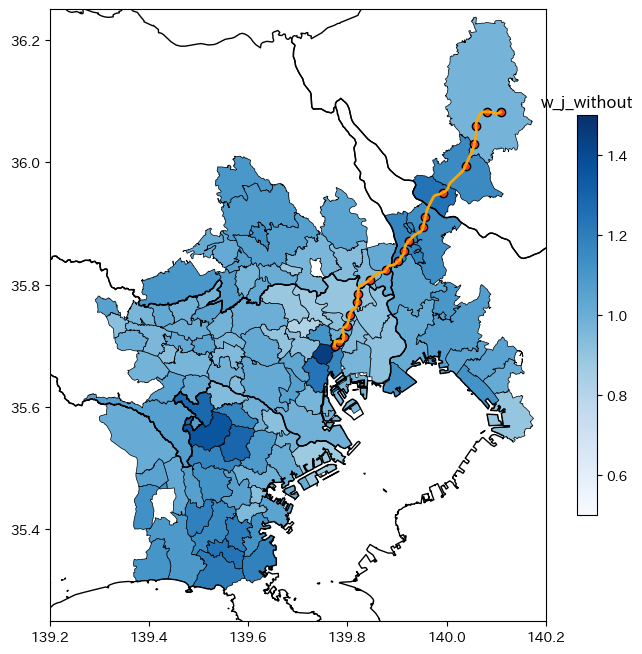

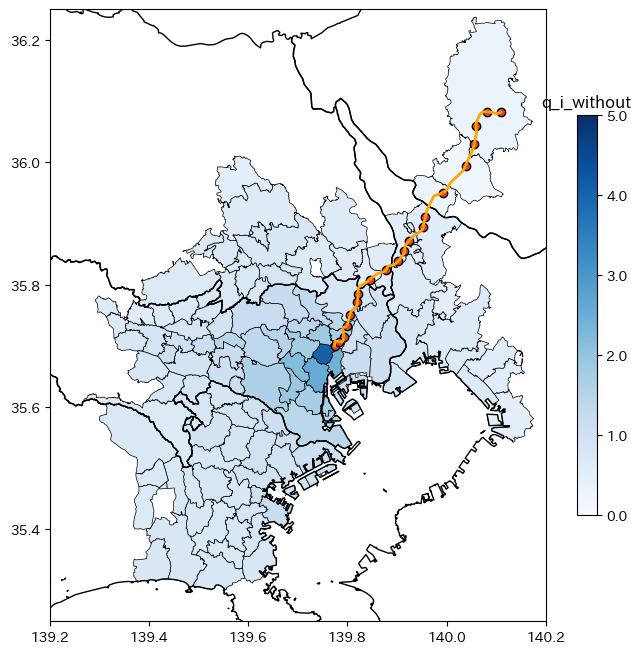

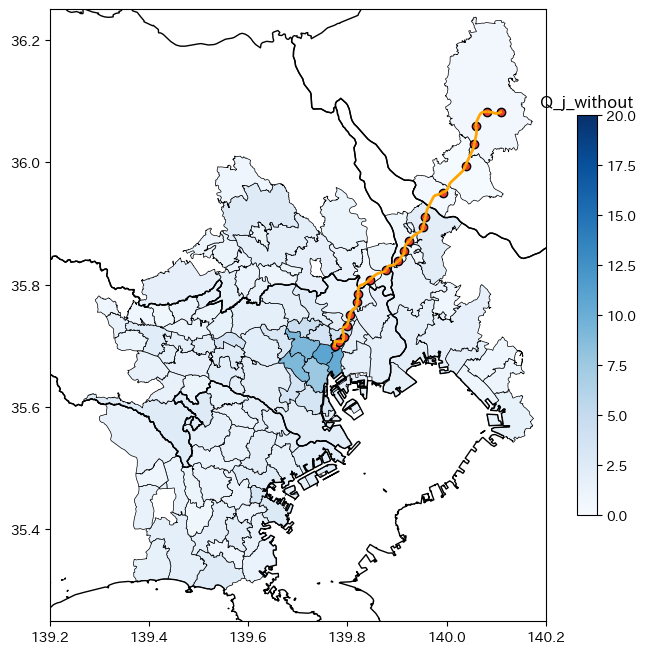

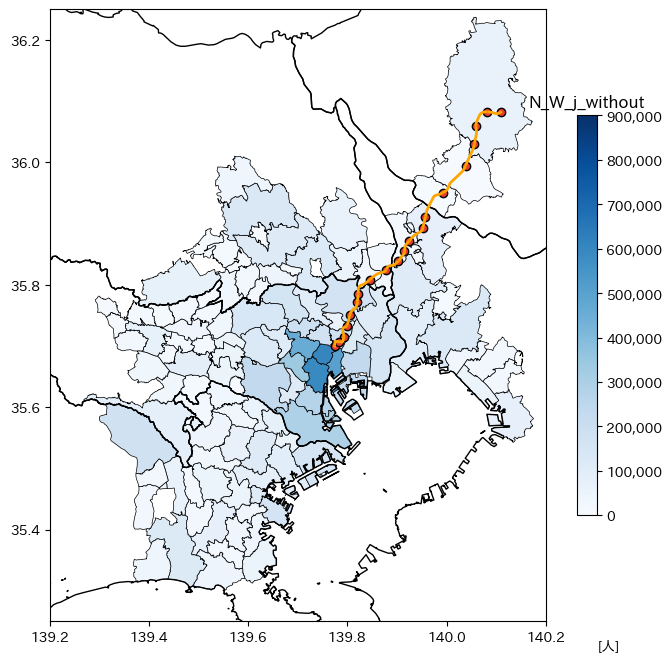

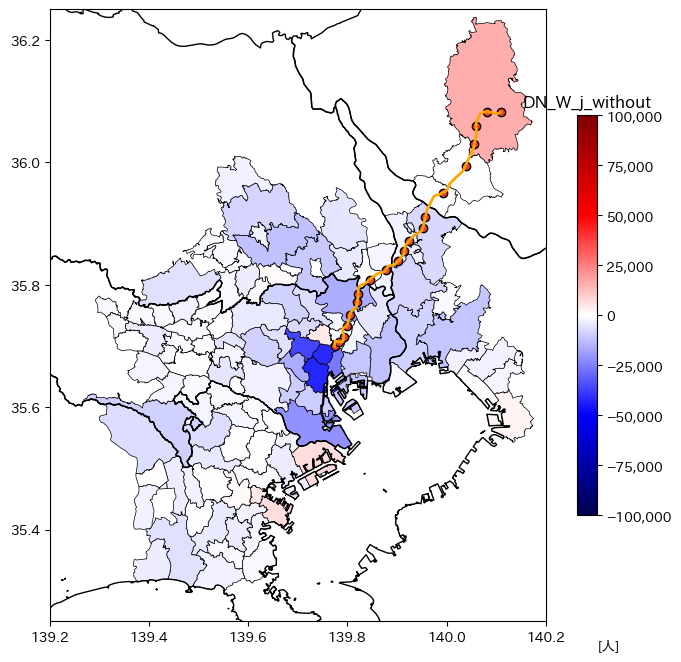

...

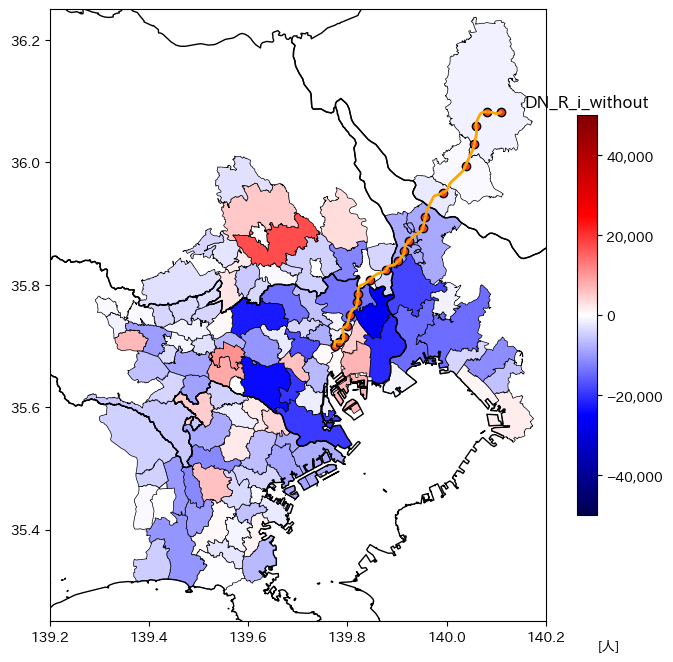

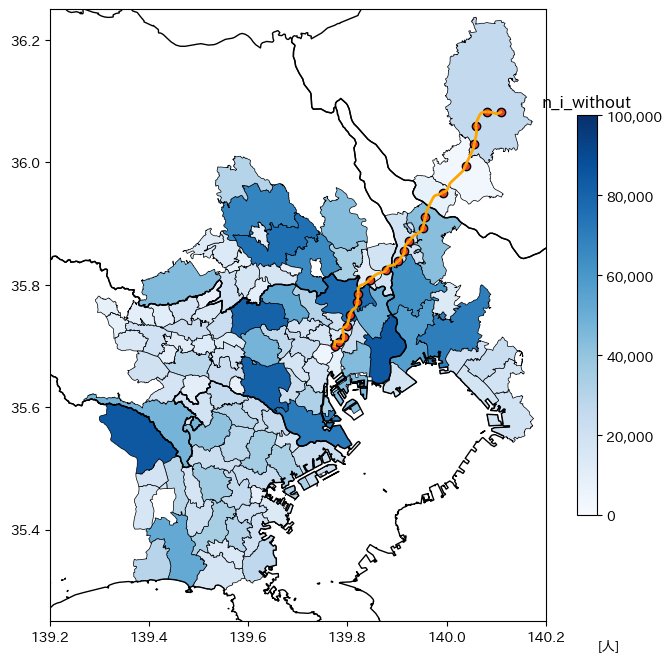

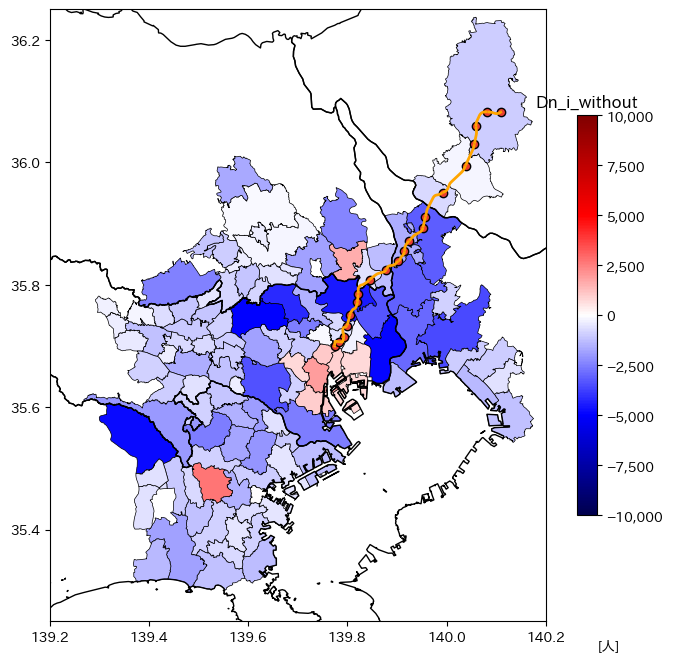

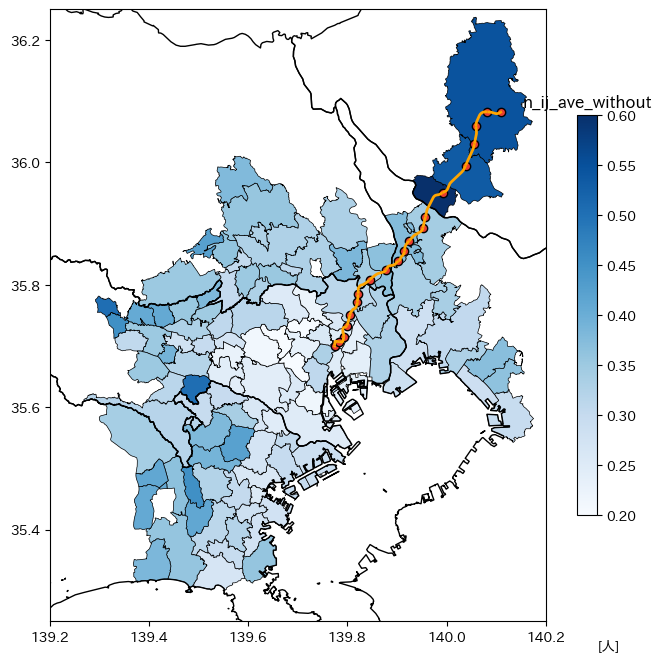

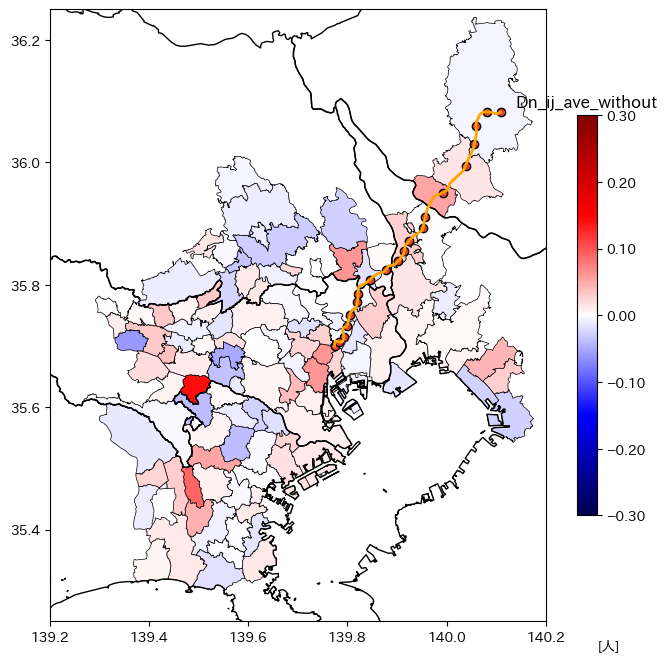

In [12]:
# f_3 simulation
dirname = 'simulation_tx_without'
N_p = f_1.exog_prev['N']
N_n = f_1.exog_next['N']
ref = f_1.ref_prev
#res = f_3.res_next
data = '20250123_083134' # 10**6 推定params 0.05,0.02
with open(f"results/{dirname}/{data}.pkl", "rb") as f: res = pickle.load(f)

print('子供の総数の基準値:    ',np.sum(ref['n_i']))
print('子供の総数のwithout:  ',np.sum(N_n*res['Pi_ij']*res['n_ij']))
print('withtoutと基準値値の差:', np.sum(N_n*res['Pi_ij']*res['n_ij'])-np.sum(ref['n_i']))

df_ij_without = pd.DataFrame({
    'jcode': jcode,
    'n_i_without': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=1),
    'Dn_i_without': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=1)-np.sum(N_p*ref['Pi_ij']*ref['n_ij'], axis=1),
    'n_j_without': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=0),
    'Dn_j_without': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=0)-np.sum(N_p*ref['Pi_ij']*ref['n_ij'], axis=0),
    'H_R_ij_ave_without': np.sum(res['H_R_ij']*N_n*res['Pi_ij'], axis=1)/res['N_R_i'],
    'DH_R_ij_ave_without': np.sum(res['H_R_ij']*N_n*res['Pi_ij'], axis=1)/res['N_R_i'] - np.sum(ref['H_R_ij']*N_p*ref['Pi_ij'], axis=1)/ref['N_R_i'],
    'n_ij_ave_without': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=1)/res['N_R_i'],
    'Dn_ij_ave_without': np.sum(N_n*res['Pi_ij']*res['n_ij'], axis=1)/res['N_R_i'] - np.sum(N_p*ref['Pi_ij']*ref['n_ij'], axis=1)/ref['N_R_i'],
})
gdf_vis_without =         gdf.merge(pd.DataFrame({'jcode':jcode,'N_R_i_without':res['N_R_i']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'DN_R_i_without':res['N_R_i']-ref['N_R_i']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'N_W_j_without':res['N_W_j']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'DN_W_j_without':res['N_W_j']-ref['N_W_j']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'H_R_i_without':res['H_R_i']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'H_W_j_without':res['H_W_j']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'H_i_without':res['H_i']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'A_j_without':res['A_j']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'B_i_without':res['B_i']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'q_i_without':res['q_i']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'Q_j_without':res['Q_j']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'w_j_without':res['w_j']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'Ups_without':res['Ups_j']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(pd.DataFrame({'jcode':jcode,'Omg_without':res['Omega_i']}), on='jcode', how='left')
gdf_vis_without = gdf_vis_without.merge(df_ij_without, on='jcode', how='left')

plot_gdf_tx(gdf_vis_without, dirname, 'w_j_without', '', 0.5, 1.5, '{x:,.1f}')
plot_gdf_tx(gdf_vis_without, dirname, 'q_i_without', '', 0, 5, '{x:,.1f}')
plot_gdf_tx(gdf_vis_without, dirname, 'Q_j_without', '', 0, 20, '{x:,.1f}')
plot_gdf_tx(gdf_vis_without, dirname, 'N_W_j_without', '[人]', 0, 900000, '{x:,.0f}')
plot_gdf_tx(gdf_vis_without, dirname, 'DN_W_j_without', '[人]', -100000, 100000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_without, dirname, 'N_R_i_without', '[人]', 0, 400000, '{x:,.0f}')
plot_gdf_tx(gdf_vis_without, dirname, 'DN_R_i_without', '[人]', -50000, 50000, '{x:,.0f}')
plot_gdf_tx(gdf_vis_without, dirname, 'n_i_without', '[人]', 0, 100000,'{x:,.0f}')
# plot_gdf_tx(gdf_vis_without, dirname, 'n_j_without', '[人]', 0, 100000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_without, dirname, 'Dn_i_without', '[人]', -10000, 10000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_without, dirname, 'n_ij_ave_without', '[人]', 0.2, 0.6, '{x:,.2f}')
plot_gdf_tx(gdf_vis_without, dirname, 'Dn_ij_ave_without', '[人]', -0.3, 0.3,'{x:,.2f}')

子供の総数のwith:       3050514.1424078755
子供の総数のwithout:    3052080.5285650752
withtoutと基準値値の差: -1566.3861571997404


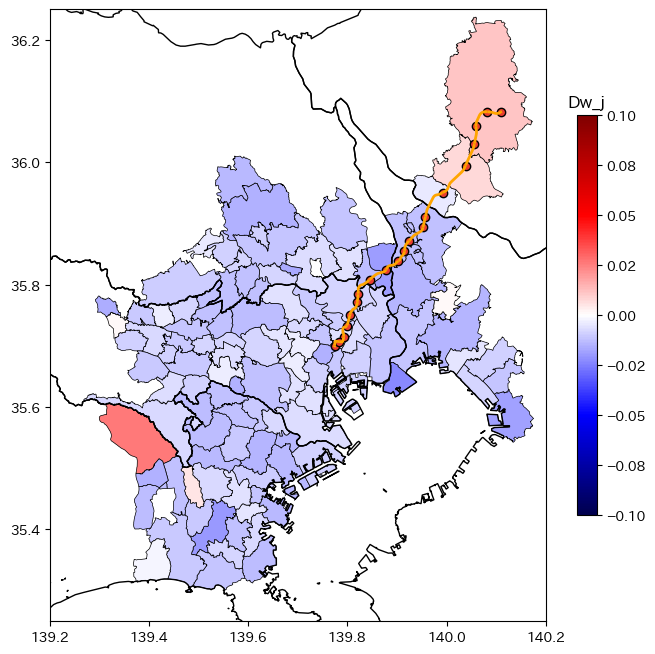

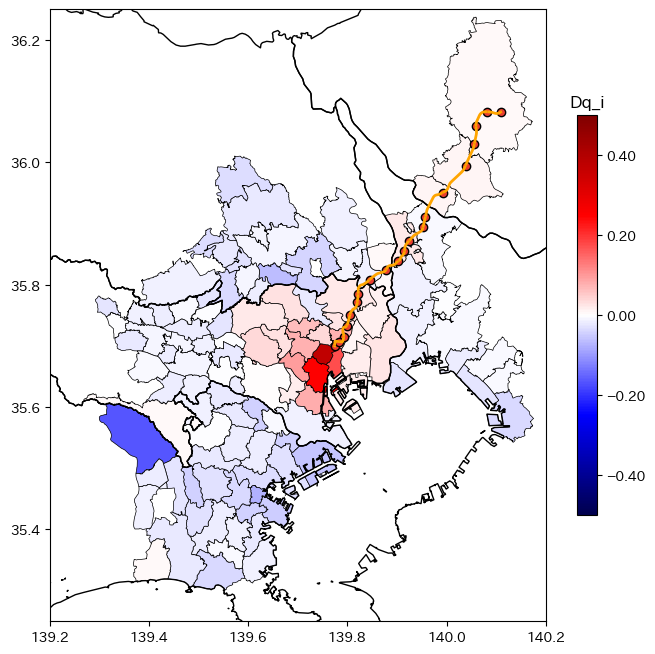

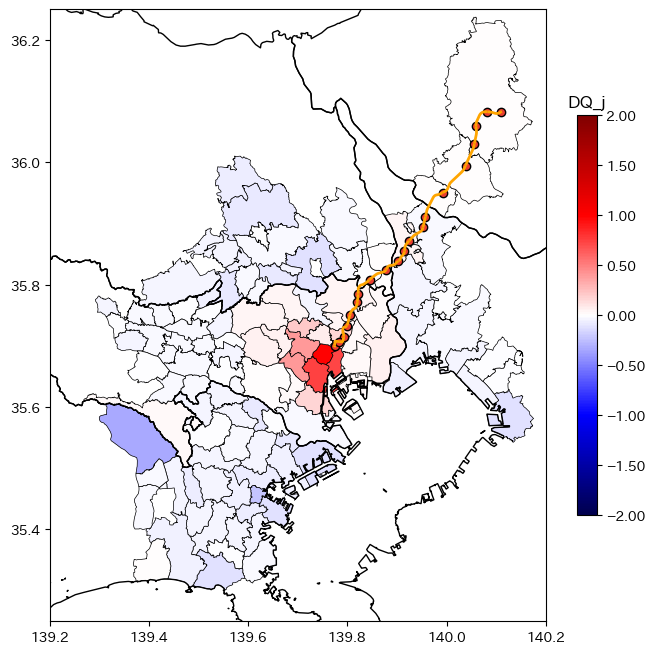

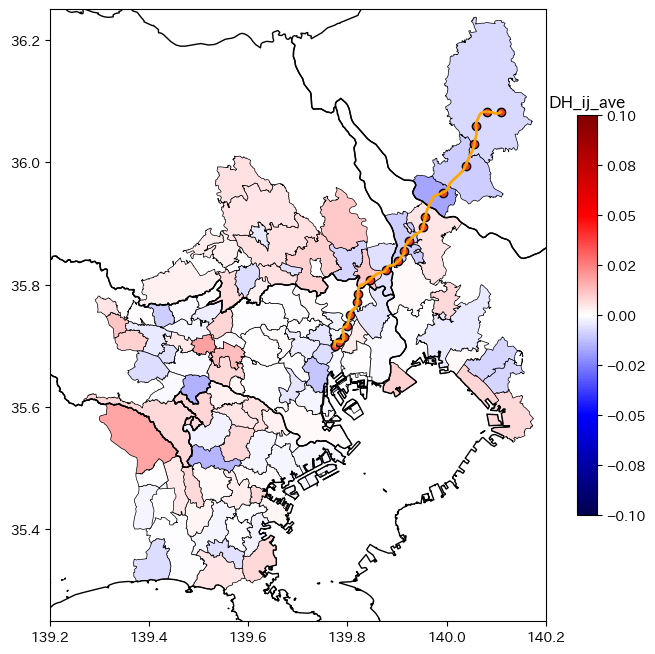

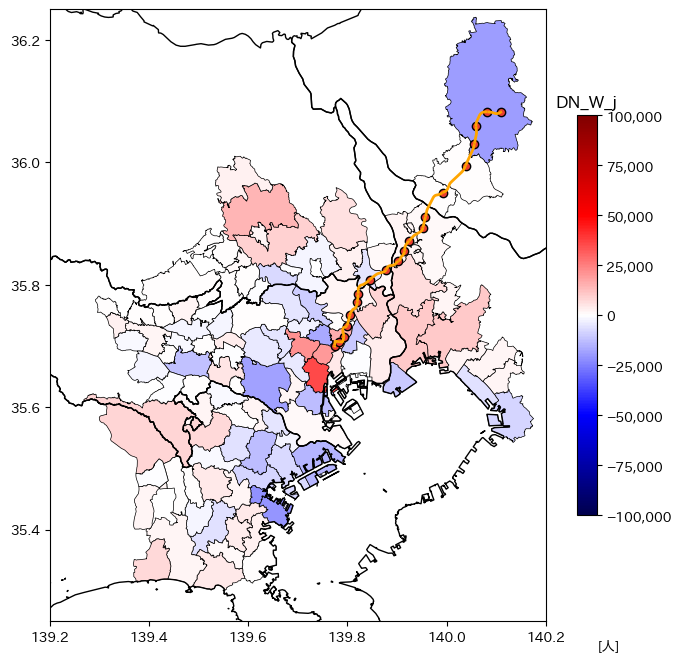

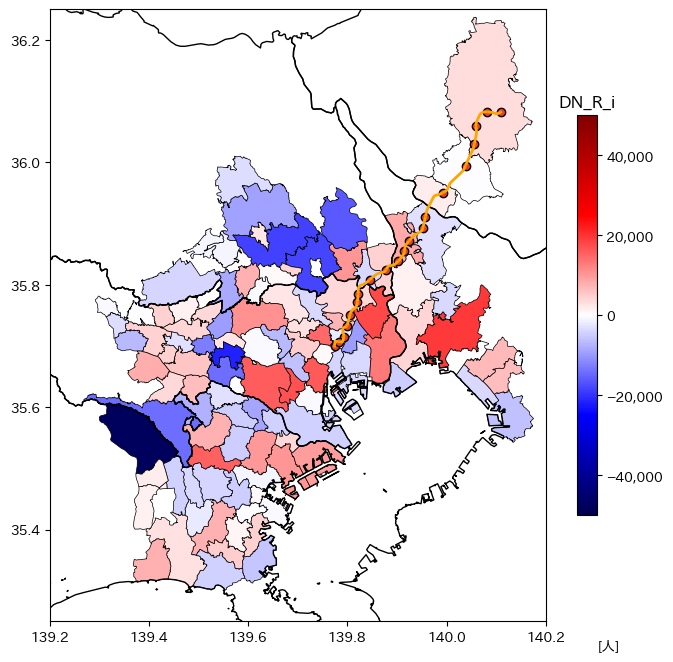

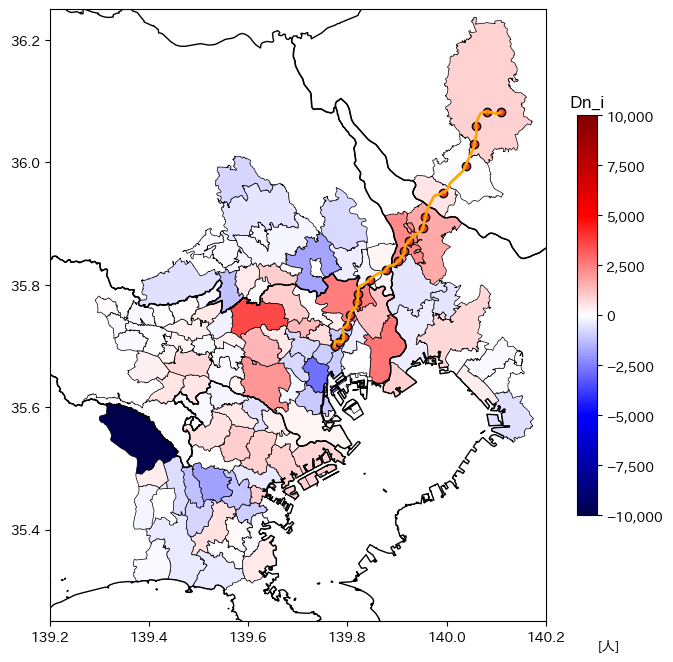

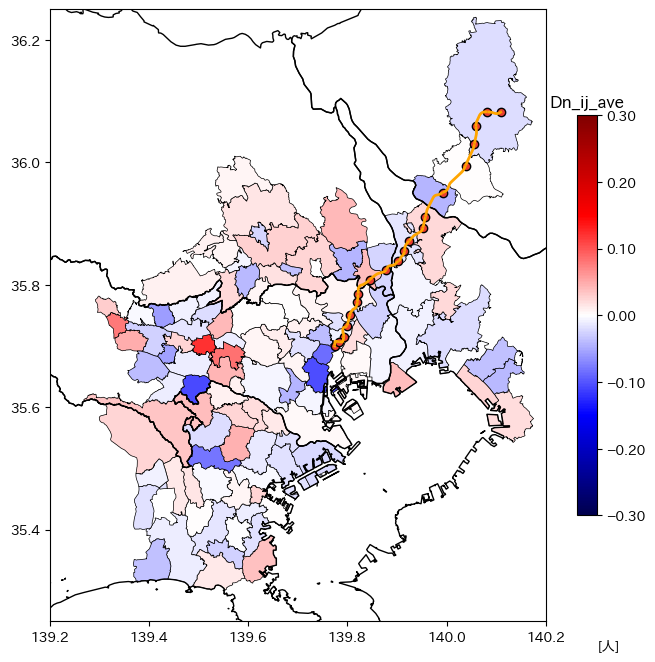

In [13]:
dirname = 'result'

print('子供の総数のwith:      ',gdf_vis_with['n_i_with'].sum())
print('子供の総数のwithout:   ',gdf_vis_without['n_i_without'].sum())
print('withtoutと基準値値の差:', gdf_vis_with['n_i_with'].sum()-gdf_vis_without['n_i_without'].sum())

gdf_vis_res = gdf.copy()
gdf_vis_res['Dw_j'] = gdf_vis_with['w_j_with'] - gdf_vis_without['w_j_without']
gdf_vis_res['Dq_i'] = gdf_vis_with['q_i_with'] - gdf_vis_without['q_i_without']
gdf_vis_res['DQ_j'] = gdf_vis_with['Q_j_with'] - gdf_vis_without['Q_j_without']
gdf_vis_res['DH_ij_ave'] = gdf_vis_with['H_R_ij_ave_with'] - gdf_vis_without['H_R_ij_ave_without']
gdf_vis_res['DN_R_i'] = gdf_vis_with['N_R_i_with'] - gdf_vis_without['N_R_i_without']
gdf_vis_res['DN_W_j'] = gdf_vis_with['N_W_j_with'] - gdf_vis_without['N_W_j_without']
gdf_vis_res['Dn_i'] = gdf_vis_with['n_i_with'] - gdf_vis_without['n_i_without']
gdf_vis_res['Dn_ij_ave'] = gdf_vis_with['n_ij_ave_with'] - gdf_vis_without['n_ij_ave_without']

plot_gdf_tx(gdf_vis_res, dirname, 'Dw_j', '', -0.1, 0.1,'{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'Dq_i', '', -0.5, 0.5,'{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'DQ_j', '', -2.0, 2.0,'{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'DH_ij_ave', '', -0.1, 0.1,'{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'DN_W_j', '[人]', -100000, 100000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_res, dirname, 'DN_R_i', '[人]', -50000, 50000, '{x:,.0f}')
plot_gdf_tx(gdf_vis_res, dirname, 'Dn_i', '[人]', -10000, 10000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_res, dirname, 'Dn_ij_ave', '[人]', -0.3, 0.3,'{x:,.2f}')

In [ ]:
gdf_vis_d

子供の総数のwith:       3326439.5474385065
子供の総数のwithout:    3052080.5285650752
withtoutと基準値値の差: 274359.01887343125


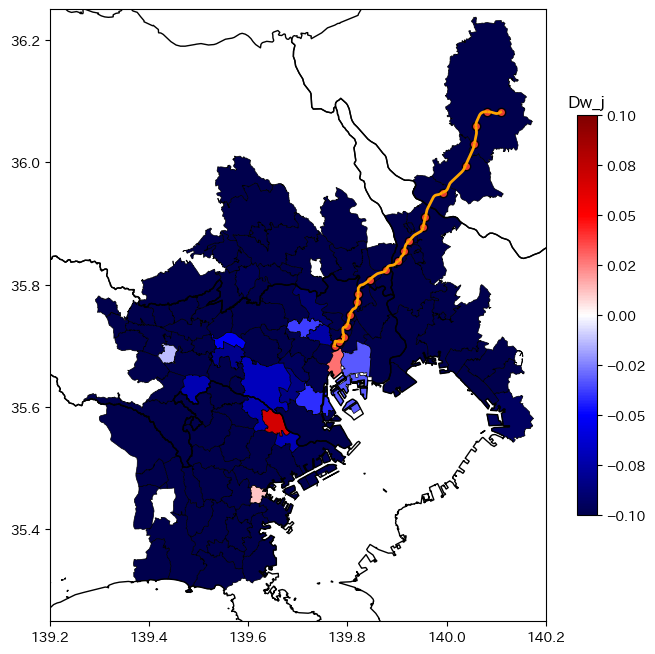

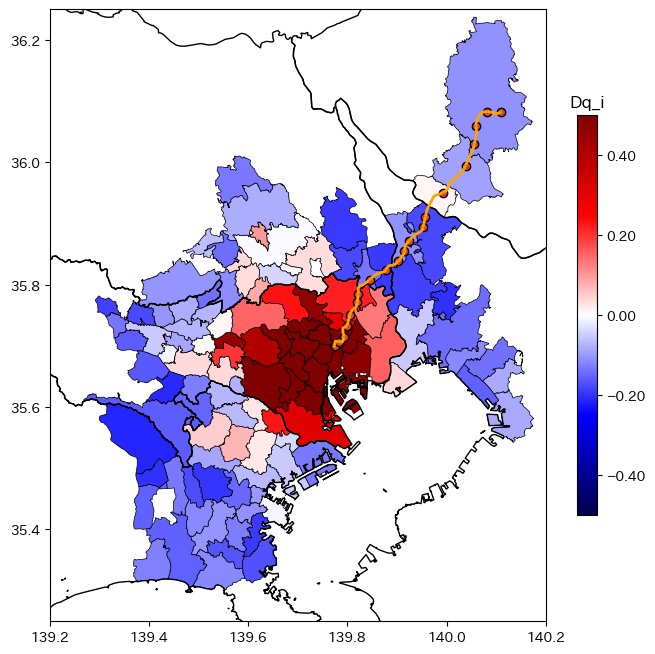

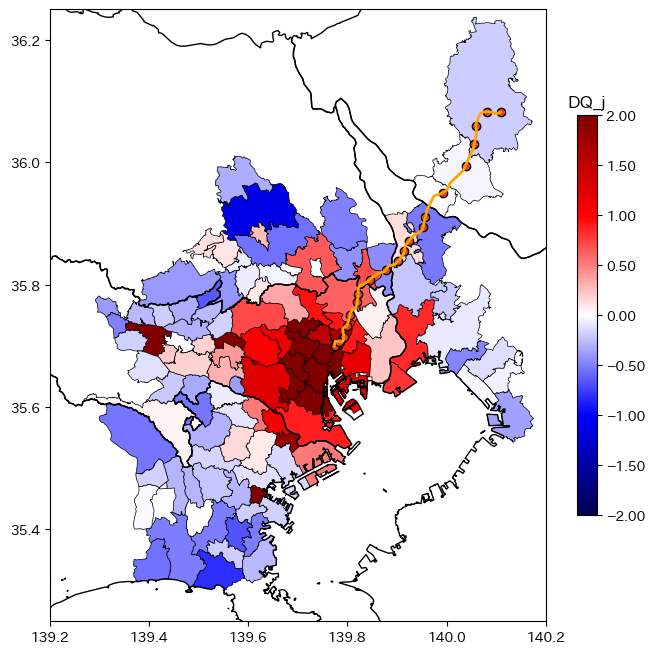

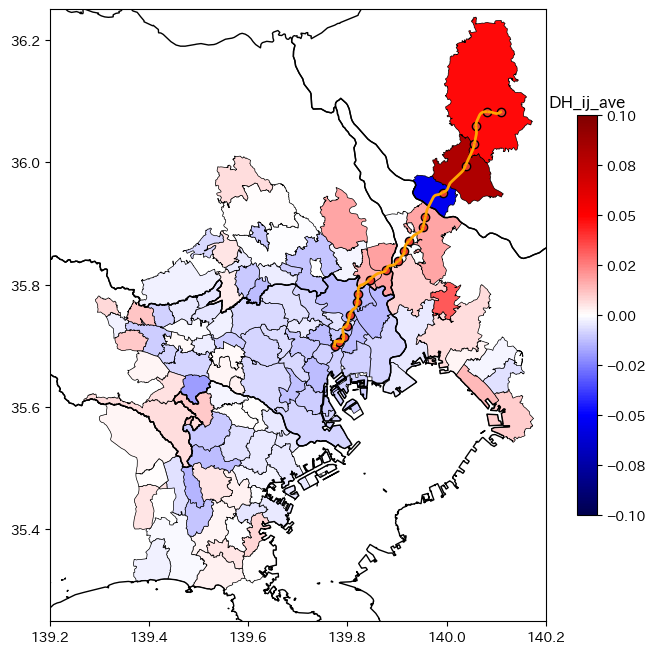

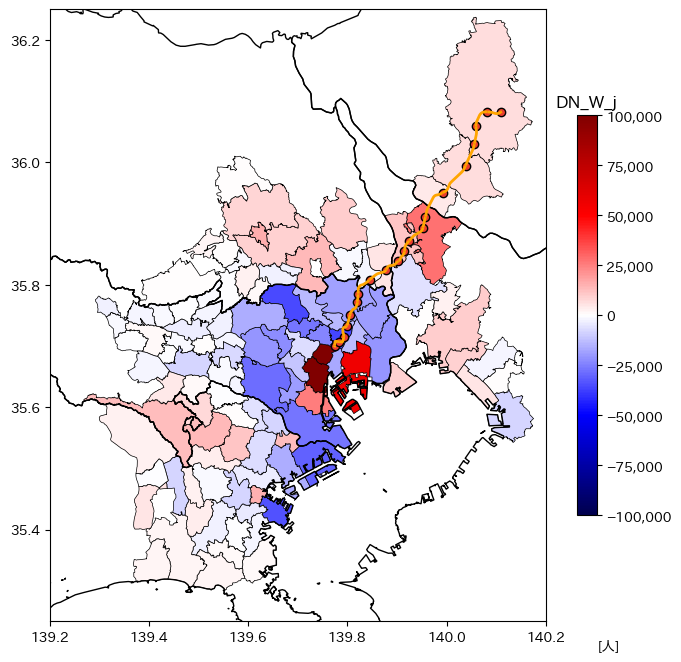

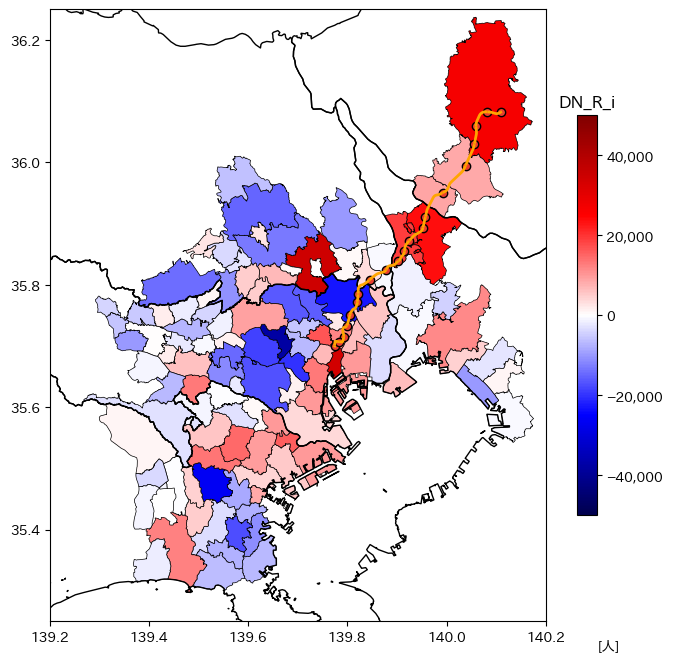

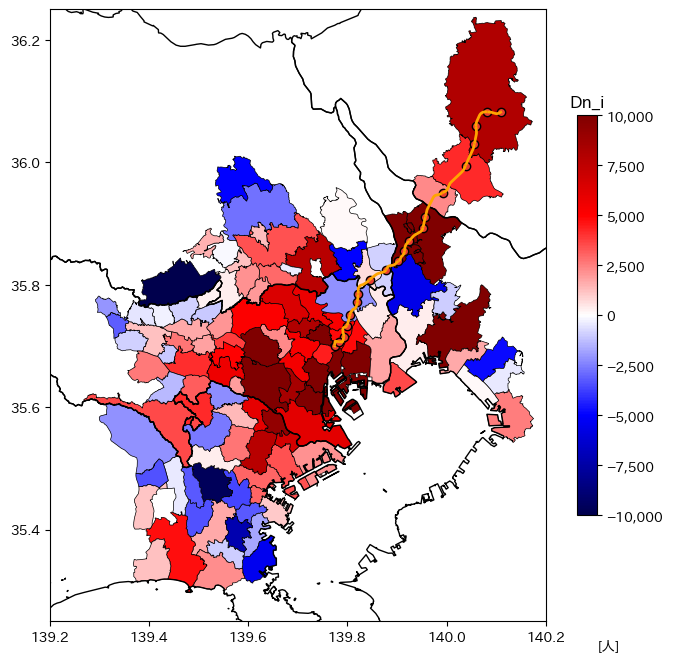

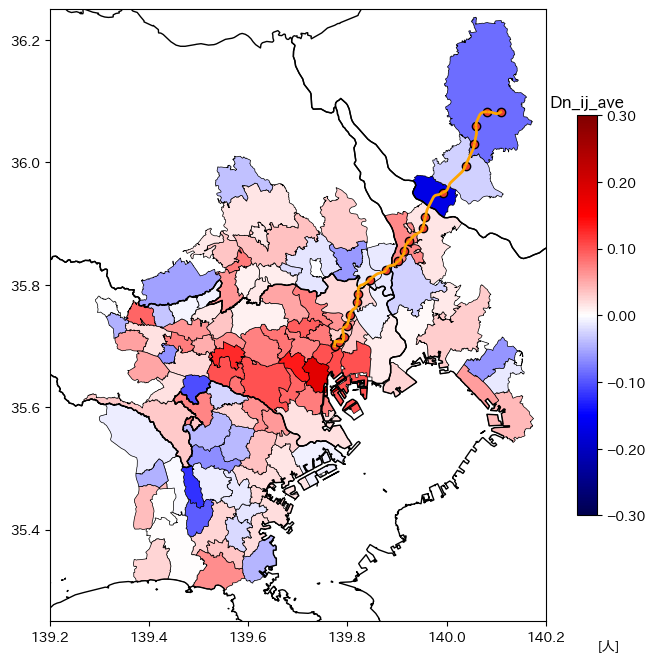

In [18]:
dirname = 'result'

print('子供の総数のwith:      ',gdf_vis_dif['n_i_real'].sum())
print('子供の総数のwithout:   ',gdf_vis_without['n_i_without'].sum())
print('withtoutと基準値値の差:', gdf_vis_dif['n_i_real'].sum()-gdf_vis_without['n_i_without'].sum())

gdf_vis_res = gdf.copy()
gdf_vis_res['Dw_j'] = gdf_vis_dif['w_j_real'] - gdf_vis_without['w_j_without']
gdf_vis_res['Dq_i'] = gdf_vis_dif['q_i_real'] - gdf_vis_without['q_i_without']
gdf_vis_res['DQ_j'] = gdf_vis_dif['Q_j_real'] - gdf_vis_without['Q_j_without']
gdf_vis_res['DH_ij_ave'] = gdf_vis_dif['H_R_ij_ave_real'] - gdf_vis_without['H_R_ij_ave_without']
gdf_vis_res['DN_R_i'] = gdf_vis_dif['N_R_i_real'] - gdf_vis_without['N_R_i_without']
gdf_vis_res['DN_W_j'] = gdf_vis_dif['N_W_j_real'] - gdf_vis_without['N_W_j_without']
gdf_vis_res['Dn_i'] = gdf_vis_dif['n_i_real'] - gdf_vis_without['n_i_without']
gdf_vis_res['Dn_ij_ave'] = gdf_vis_dif['n_ij_ave_real'] - gdf_vis_without['n_ij_ave_without']

plot_gdf_tx(gdf_vis_res, dirname, 'Dw_j', '', -0.1, 0.1,'{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'Dq_i', '', -0.5, 0.5,'{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'DQ_j', '', -2.0, 2.0,'{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'DH_ij_ave', '', -0.1, 0.1,'{x:,.2f}')
plot_gdf_tx(gdf_vis_res, dirname, 'DN_W_j', '[人]', -100000, 100000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_res, dirname, 'DN_R_i', '[人]', -50000, 50000, '{x:,.0f}')
plot_gdf_tx(gdf_vis_res, dirname, 'Dn_i', '[人]', -10000, 10000,'{x:,.0f}')
plot_gdf_tx(gdf_vis_res, dirname, 'Dn_ij_ave', '[人]', -0.3, 0.3,'{x:,.2f}')

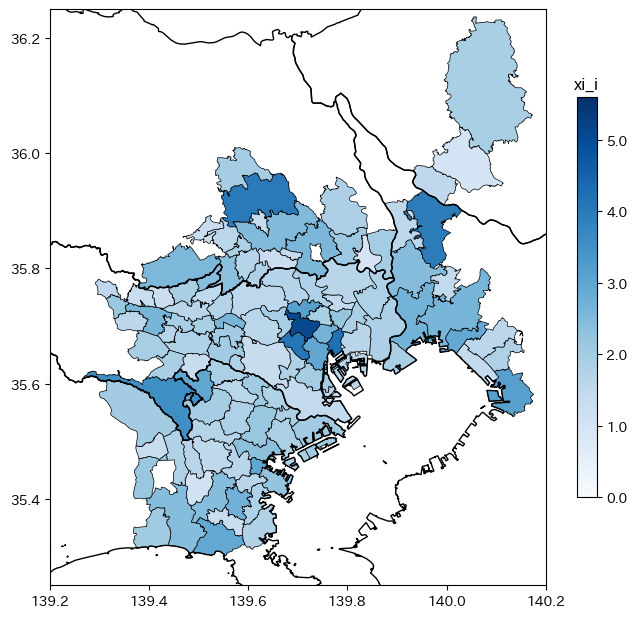

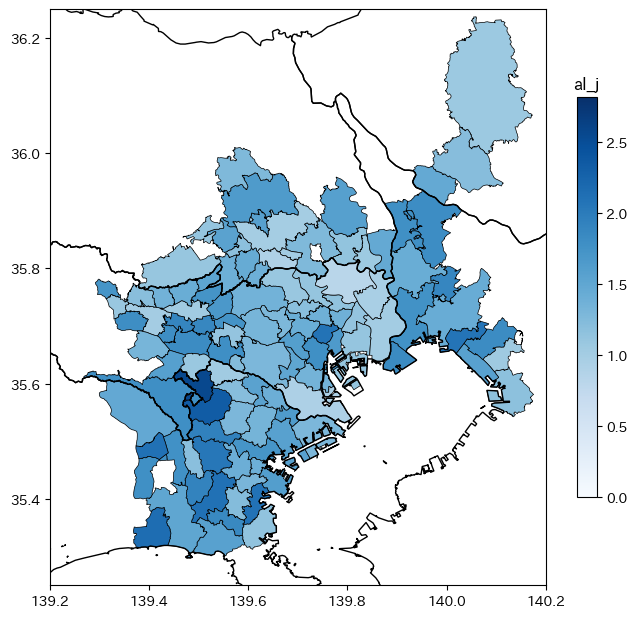

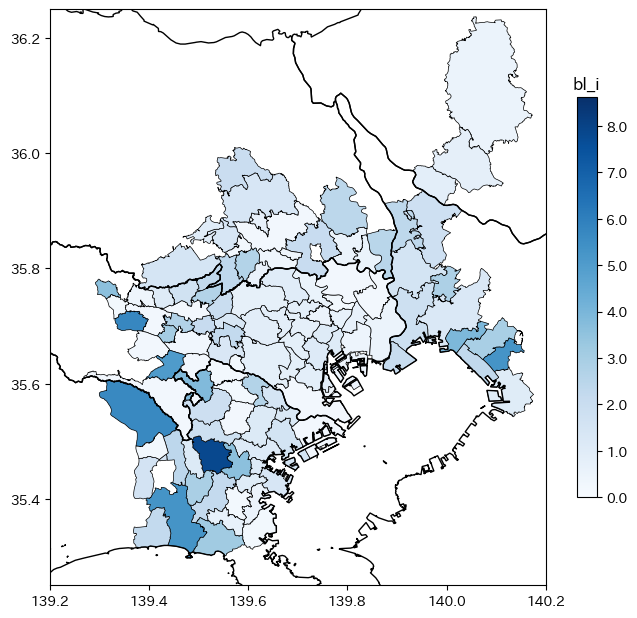

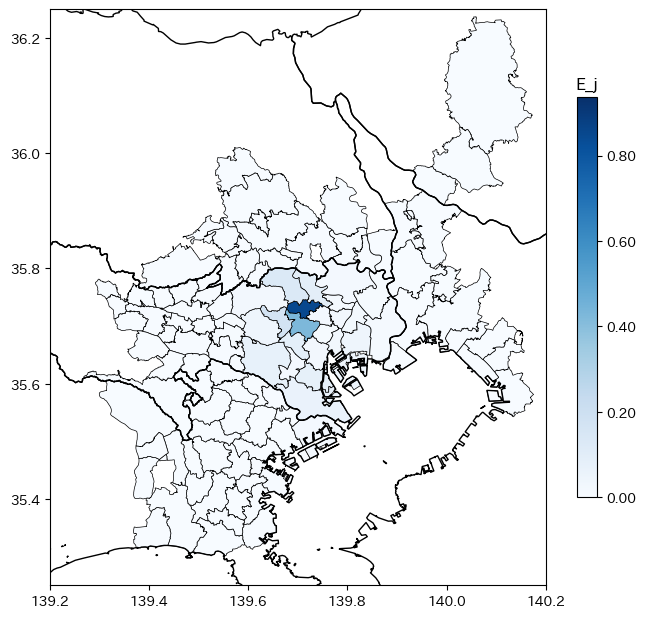

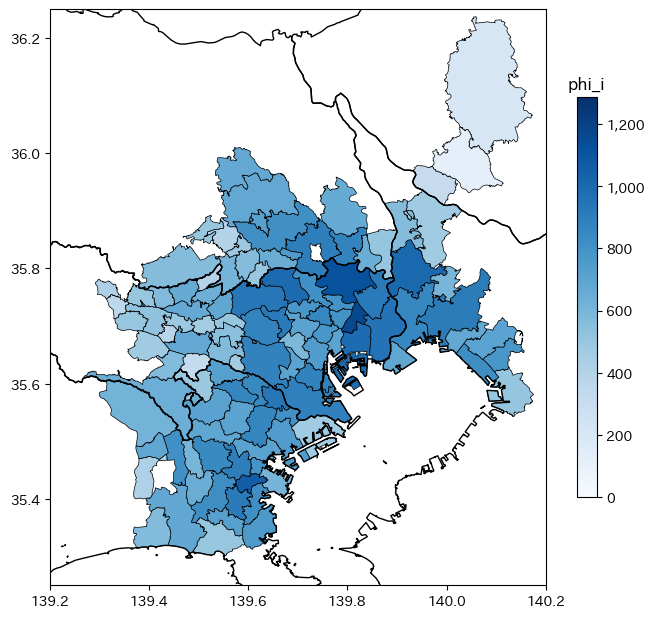

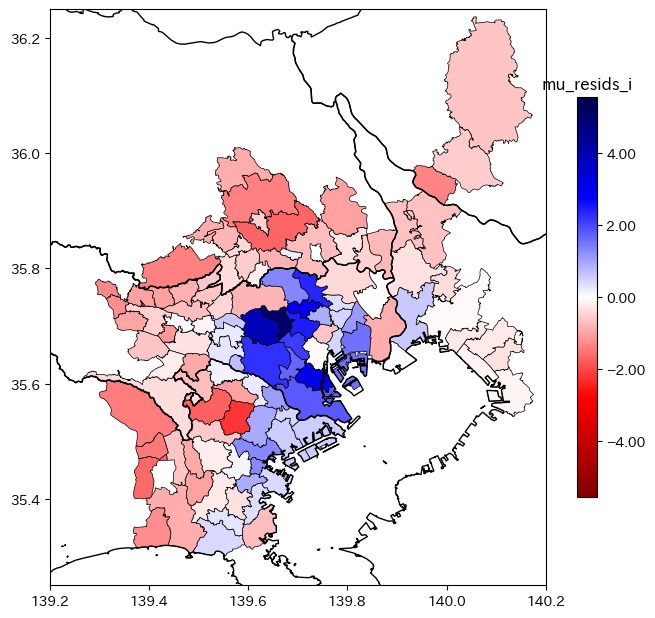

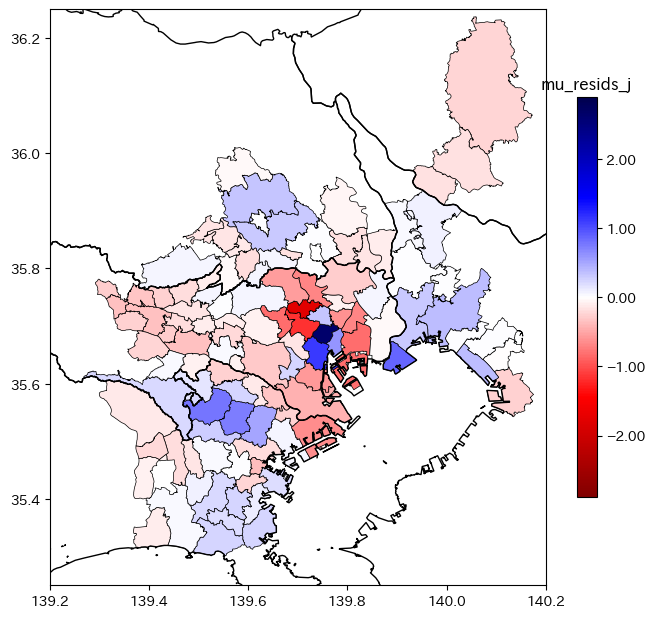

In [25]:
# f_2 fundmentals
dirname = 'fund_prev'
exog = f_2.exog_prev
ref = f_2.ref_prev

df_ij_fund = pd.DataFrame({
    'jcode': jcode,
    'mu_resids_i': np.sum(exog['mu_resids_ij'], axis=1),
    'mu_resids_j': np.sum(exog['mu_resids_ij'], axis=0),
})

gdf_vis_fund = gdf.merge(pd.DataFrame({'jcode':jcode,'xi_i':exog['xi_i']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(pd.DataFrame({'jcode':jcode,'E_j':exog['E_j']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(pd.DataFrame({'jcode':jcode,'al_j':exog['al_j']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(pd.DataFrame({'jcode':jcode,'bl_i':exog['bl_i']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(pd.DataFrame({'jcode':jcode,'phi_i':exog['phi_i']}), on='jcode', how='left')
gdf_vis_fund = gdf_vis_fund.merge(df_ij_fund, on='jcode', how='left')

plot_gdf(gdf_vis_fund, dirname, 'xi_i', '', '{x:,.1f}')
plot_gdf(gdf_vis_fund, dirname, 'al_j', '', '{x:,.1f}')
plot_gdf(gdf_vis_fund, dirname, 'bl_i', '', '{x:,.1f}')
plot_gdf(gdf_vis_fund, dirname, 'E_j', '', '{x:,.2f}')
plot_gdf(gdf_vis_fund, dirname, 'phi_i', '', '{x:,.0f}')
plot_gdf(gdf_vis_fund, dirname, 'mu_resids_i', '', '{x:,.2f}')
plot_gdf(gdf_vis_fund, dirname, 'mu_resids_j', '', '{x:,.2f}')

子供の総数の実測値:  3326439.5474385065
子供の総数の推定値:  3326439.638758836
実測値と推定値の差:  -0.09132032934576273


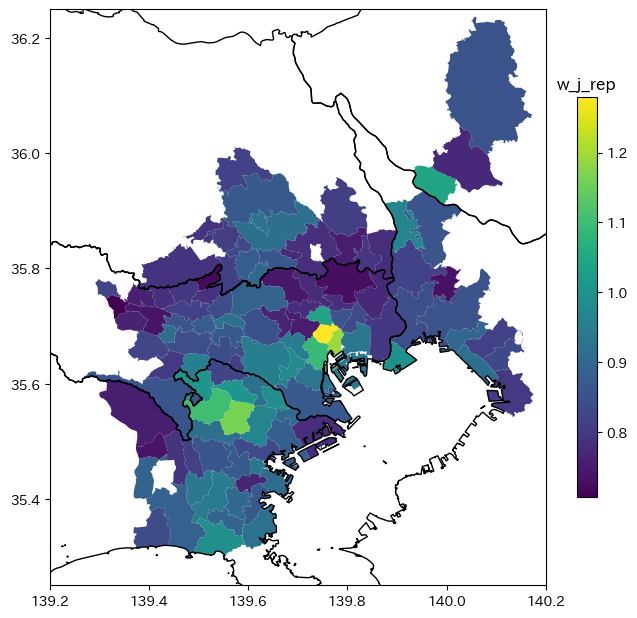

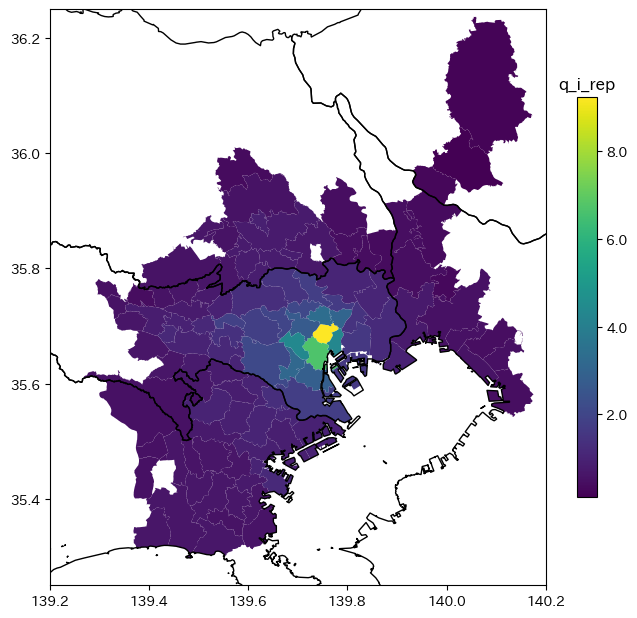

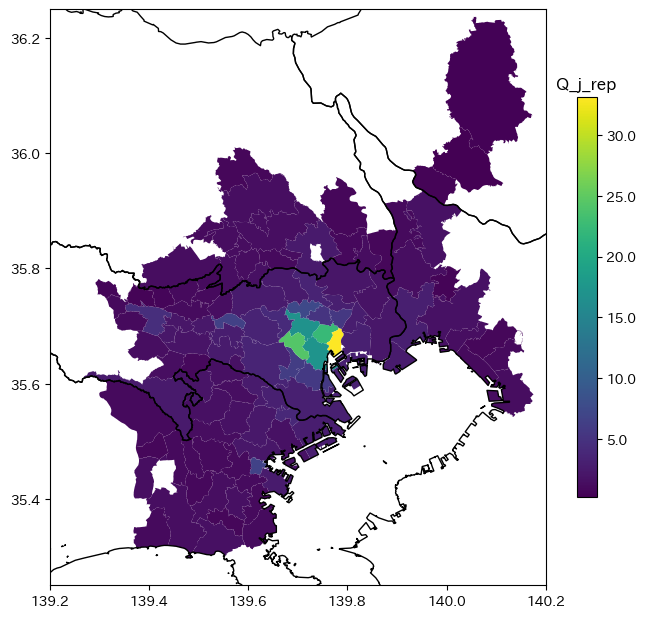

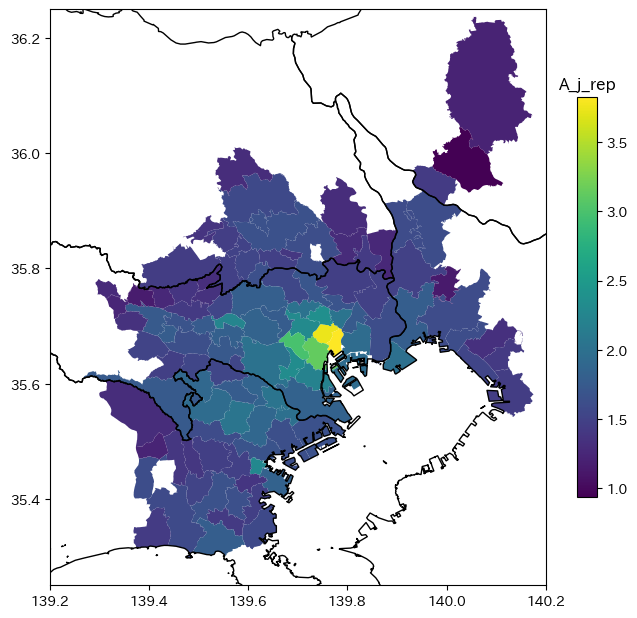

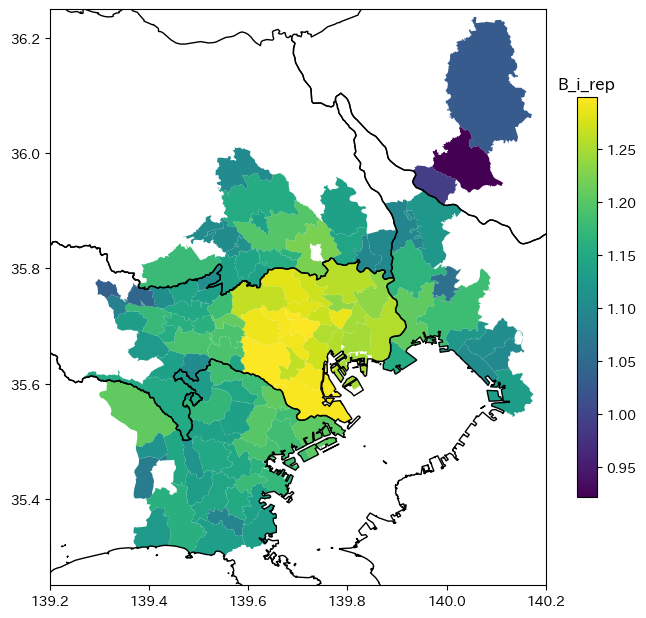

...

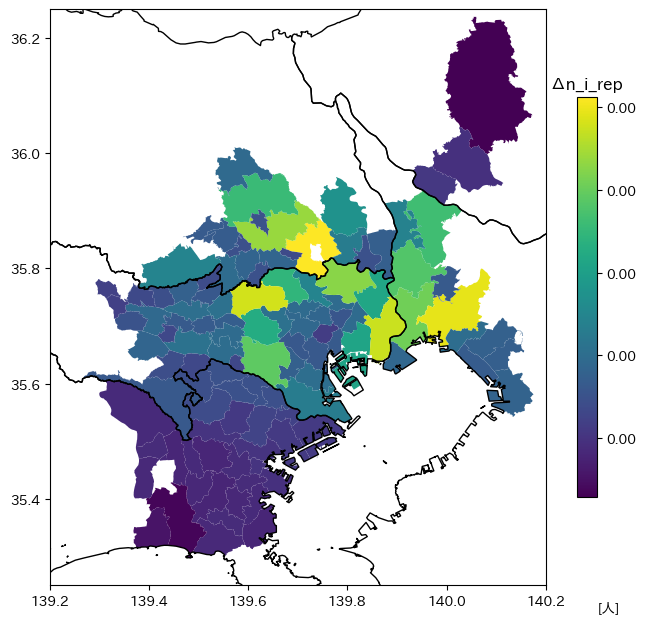

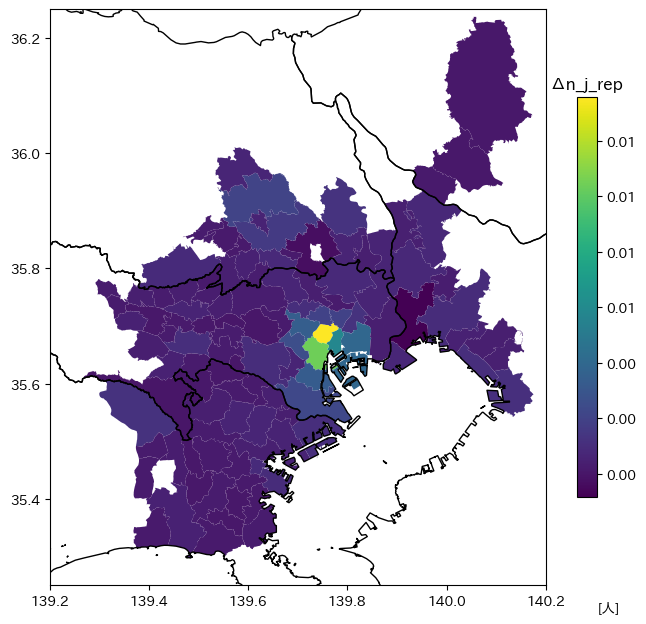

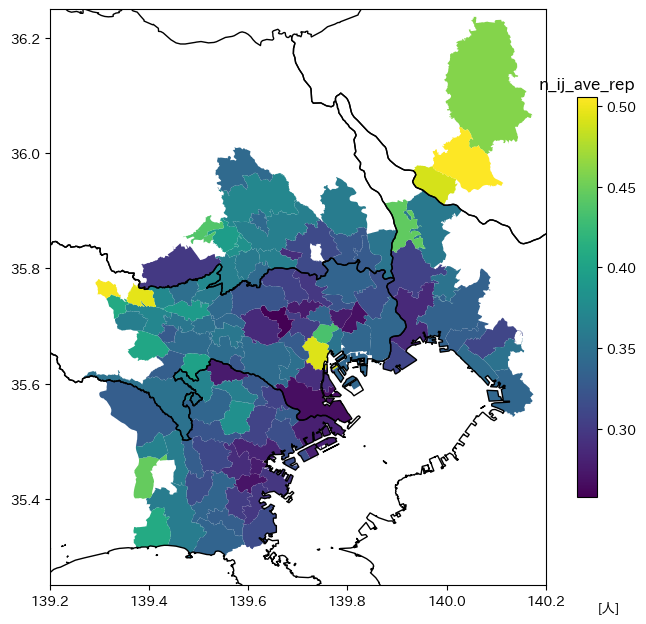

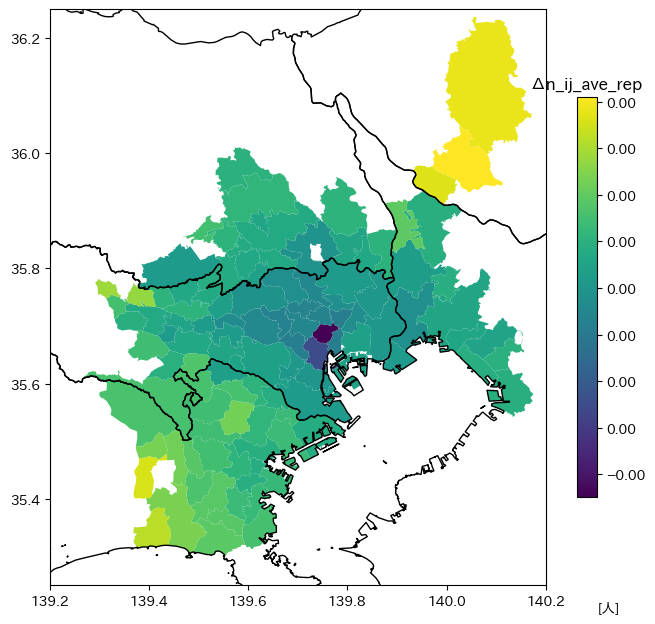

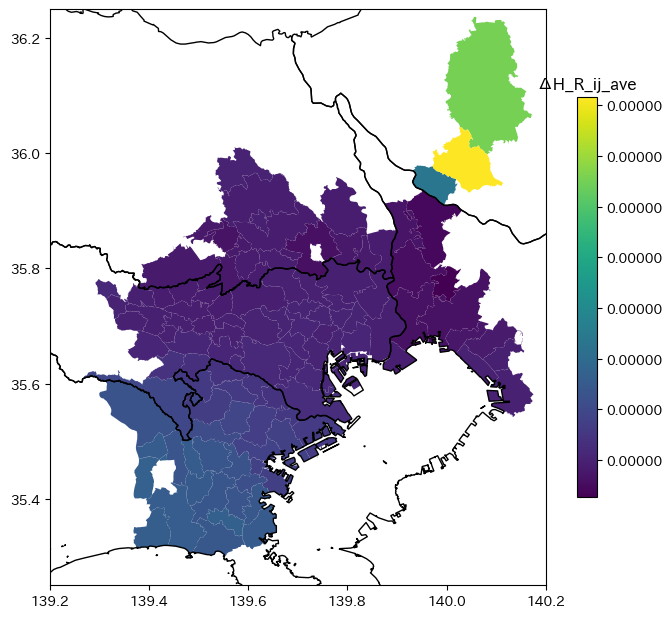

In [ ]:
# f_3 replication
dirname = 'replication_next'
exog = f_3.exog_next
ref = f_3.ref_next
rep = f_3.rep_next

print('子供の総数の実測値: ', np.sum(ref['n_i']))
print('子供の総数の推定値: ', np.sum(exog['N']*rep['Pi_ij']*rep['n_ij']))
print('実測値と推定値の差: ', np.sum(ref['n_i'])-np.sum(exog['N']*rep['Pi_ij']*rep['n_ij']))
df_ij_rep = pd.DataFrame({
    'jcode': jcode,
    'n_i_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1),
    'Δn_i_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)-np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=1),
    'n_j_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=0),
    'Δn_j_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=0)-np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=0),
    'H_R_ij_ave': np.sum(rep['H_R_ij']*exog['N']*rep['Pi_ij'], axis=1)/rep['N_R_i'],
    'ΔH_R_ij_ave': np.sum(rep['H_R_ij']*exog['N']*rep['Pi_ij'], axis=1)/rep['N_R_i'] - np.sum(ref['H_R_ij']*exog['N']*ref['Pi_ij'], axis=1)/ref['N_R_i'],
    'n_ij_ave_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)/rep['N_R_i'],
    'Δn_ij_ave_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)/rep['N_R_i'] - np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=1)/ref['N_R_i'],
})
gdf_vis_rep = gdf.merge(pd.DataFrame({'jcode':jcode,'N_R_i_rep':rep['N_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'ΔN_R_i_rep':rep['N_R_i']-ref['N_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'N_W_j_rep':rep['N_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'ΔN_W_j_rep':rep['N_W_j']-rep['N_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_R_i_rep':rep['H_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_W_j_rep':rep['H_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_i_rep':rep['H_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'A_j_rep':rep['A_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'B_i_rep':rep['B_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'q_i_rep':rep['q_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Q_j_rep':rep['Q_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'w_j_rep':rep['w_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Ups_rep':rep['Ups_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Omg_rep':rep['Omega_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(df_ij_rep, on='jcode', how='left')

plot_gdf(gdf_vis_rep, dirname, 'w_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'q_i_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'Q_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'A_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'B_i_rep', '', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'N_W_j_rep', '[人]', '{x:,.0f}')
plot_gdf(gdf_vis_rep, dirname, 'N_R_i_rep', '[人]', '{x:,.0f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_i_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_j_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'n_ij_ave_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_ij_ave_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'ΔH_R_ij_ave', '', '{x:,.5f}')

子供の総数の実測値:  3177377.089761221
子供の総数の推定値:  3177376.966605027
実測値と推定値の差:  0.12315619364380836


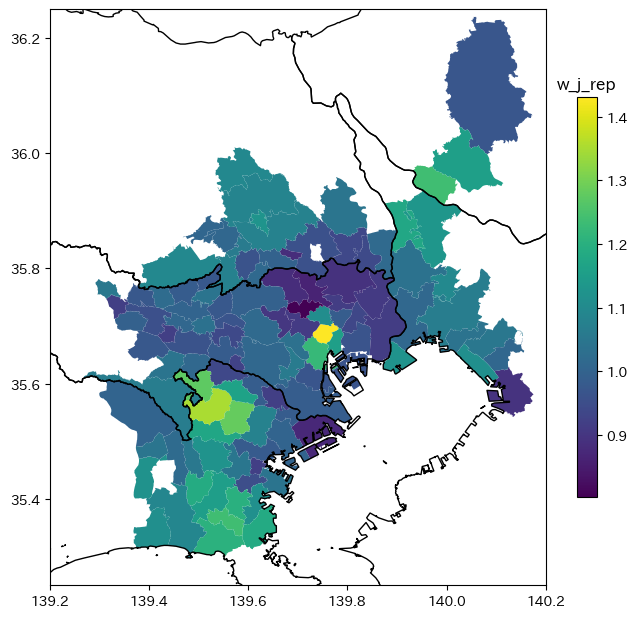

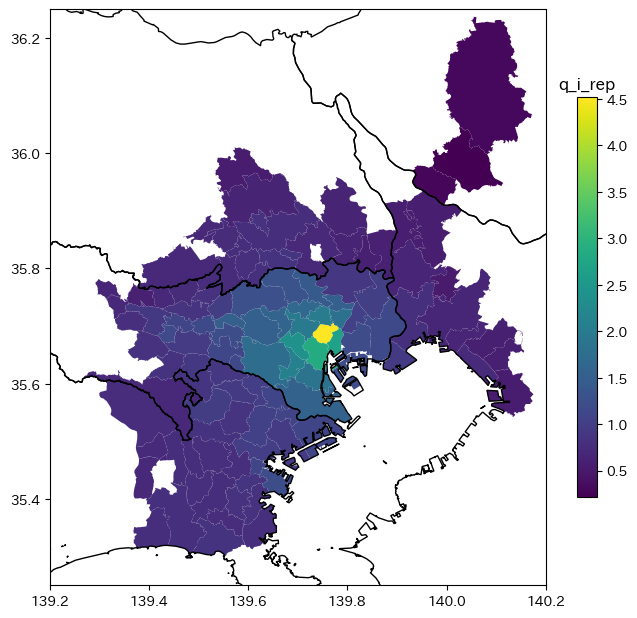

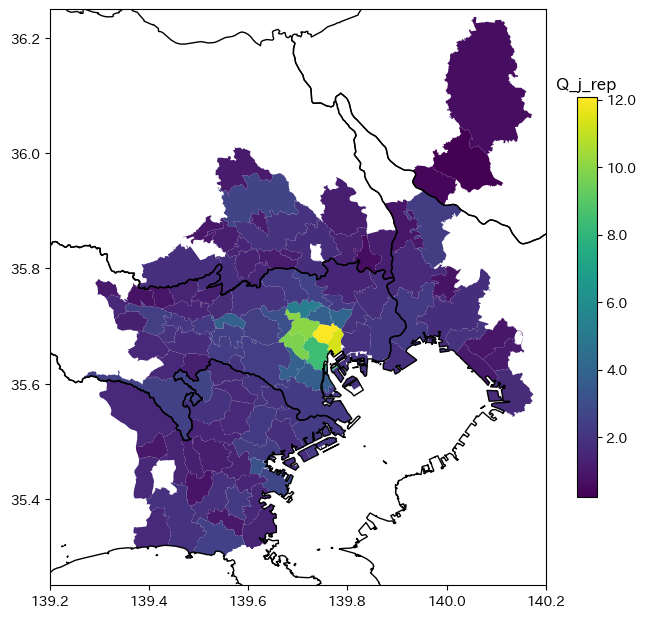

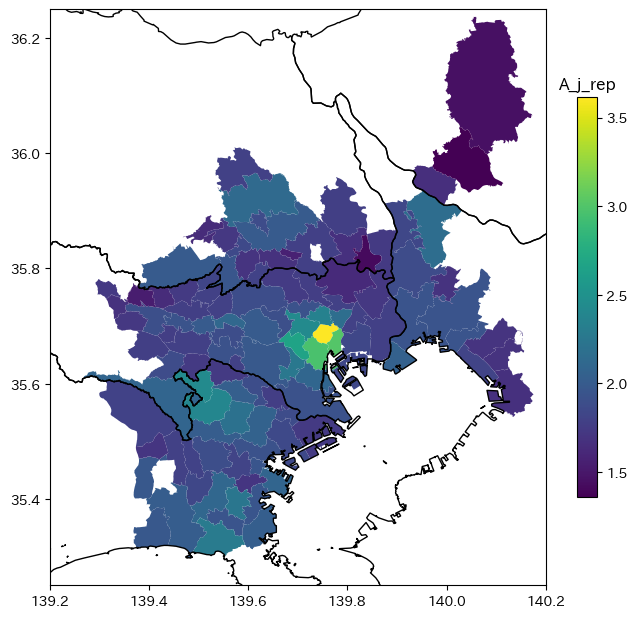

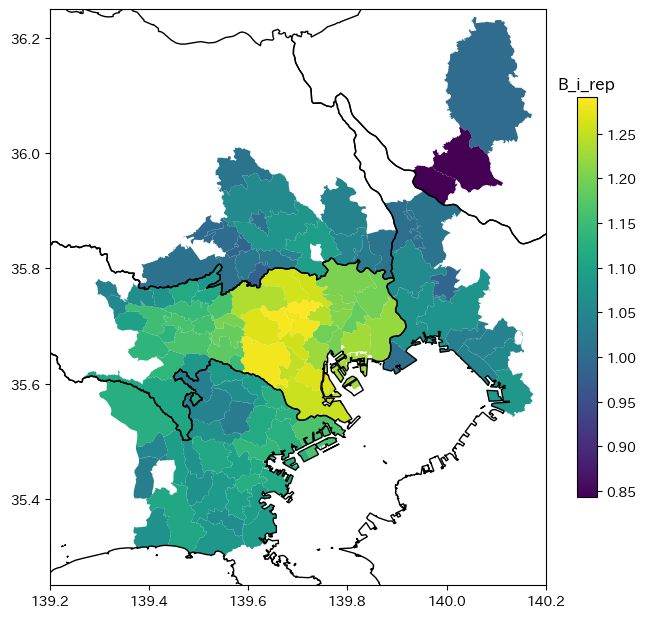

...

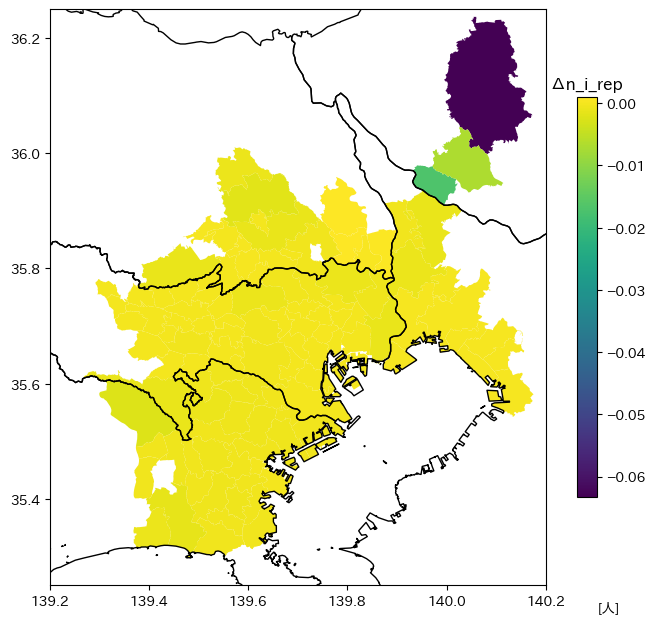

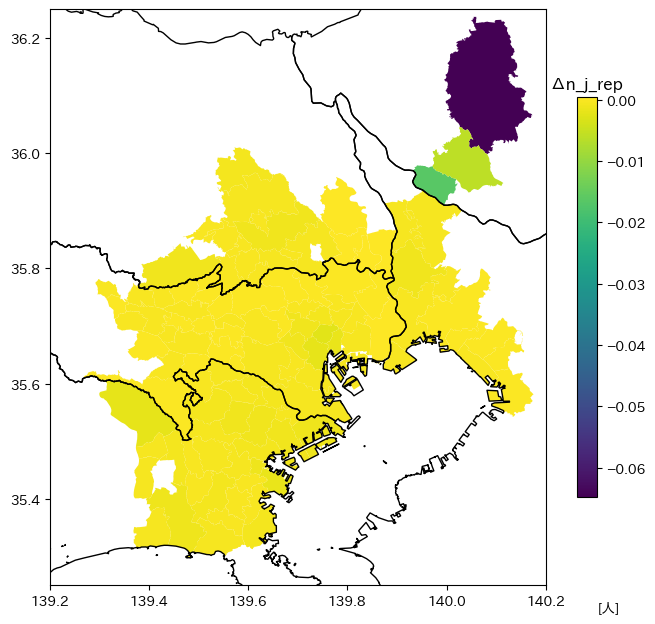

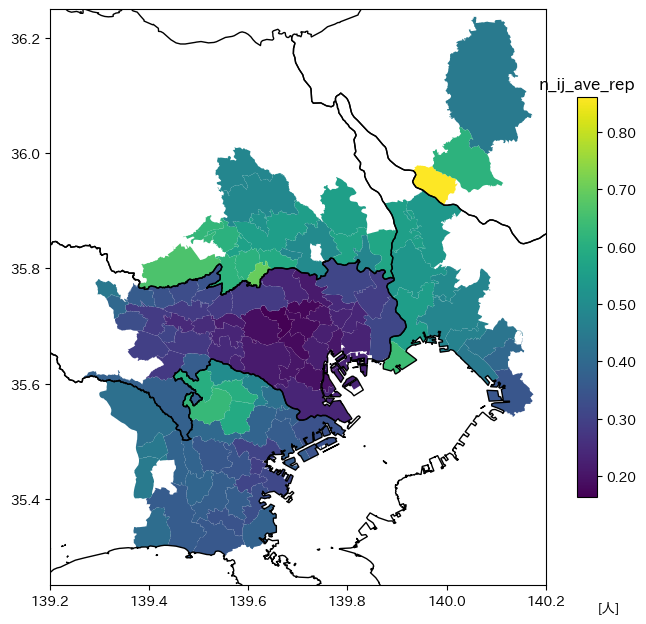

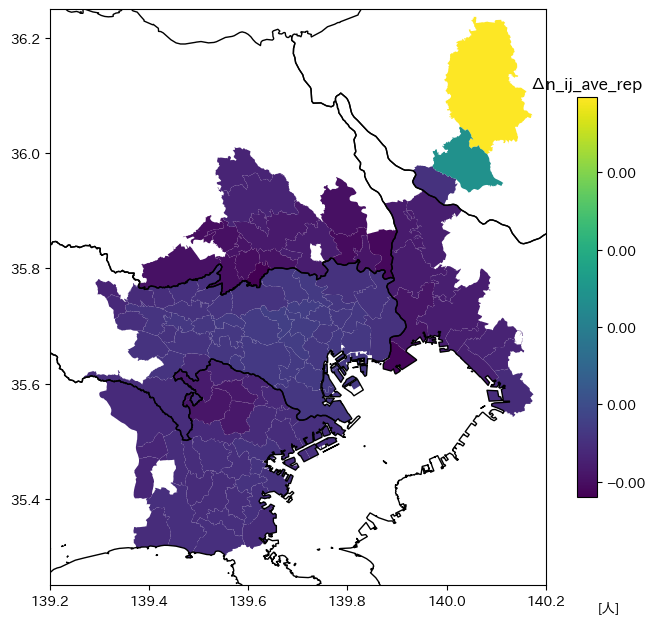

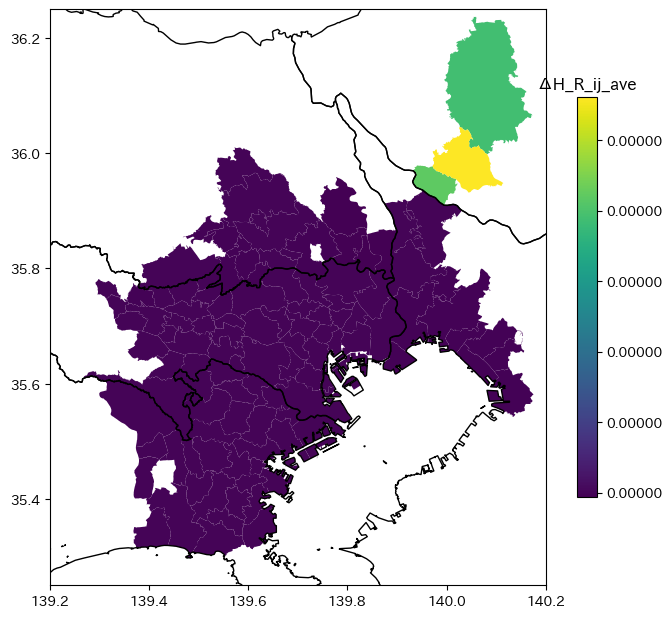

In [26]:
# f_3 replication
dirname = 'replication_prev'
exog = f_3.exog_prev
ref = f_3.ref_prev
rep = f_3.rep_prev

print('子供の総数の実測値: ', np.sum(ref['n_i']))
print('子供の総数の推定値: ', np.sum(exog['N']*rep['Pi_ij']*rep['n_ij']))
print('実測値と推定値の差: ', np.sum(ref['n_i'])-np.sum(exog['N']*rep['Pi_ij']*rep['n_ij']))
df_Pi_ij_rep = pd.DataFrame({
    'jcode': jcode,
    'n_i_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1),
    'Δn_i_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)-np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=1),
    'n_j_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=0),
    'Δn_j_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=0)-np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=0),
    'H_R_ij_ave': np.sum(rep['H_R_ij']*exog['N']*rep['Pi_ij'], axis=1)/rep['N_R_i'],
    'ΔH_R_ij_ave': np.sum(rep['H_R_ij']*exog['N']*rep['Pi_ij'], axis=1)/rep['N_R_i'] - np.sum(ref['H_R_ij']*exog['N']*ref['Pi_ij'], axis=1)/ref['N_R_i'],
    'n_ij_ave_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)/rep['N_R_i'],
    'Δn_ij_ave_rep': np.sum(exog['N']*rep['Pi_ij']*rep['n_ij'], axis=1)/rep['N_R_i'] - np.sum(exog['N']*ref['Pi_ij']*ref['n_ij'], axis=1)/ref['N_R_i'],
})
gdf_vis_rep = gdf.merge(pd.DataFrame({'jcode':jcode,'N_R_i_rep':rep['N_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'ΔN_R_i_rep':rep['N_R_i']-ref['N_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'N_W_j_rep':rep['N_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'ΔN_W_j_rep':rep['N_W_j']-rep['N_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_R_i_rep':rep['H_R_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_W_j_rep':rep['H_W_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'H_i_rep':rep['H_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'A_j_rep':rep['A_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'B_i_rep':rep['B_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'q_i_rep':rep['q_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Q_j_rep':rep['Q_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'w_j_rep':rep['w_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Ups_rep':rep['Ups_j']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(pd.DataFrame({'jcode':jcode,'Omg_rep':rep['Omega_i']}), on='jcode', how='left')
gdf_vis_rep = gdf_vis_rep.merge(df_Pi_ij_rep, on='jcode', how='left')

plot_gdf(gdf_vis_rep, dirname, 'w_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'q_i_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'Q_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'A_j_rep', '', '{x:,.1f}')
plot_gdf(gdf_vis_rep, dirname, 'B_i_rep', '', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'N_W_j_rep', '[人]', '{x:,.0f}')
plot_gdf(gdf_vis_rep, dirname, 'N_R_i_rep', '[人]', '{x:,.0f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_i_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_j_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'n_ij_ave_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'Δn_ij_ave_rep', '[人]', '{x:,.2f}')
plot_gdf(gdf_vis_rep, dirname, 'ΔH_R_ij_ave', '', '{x:,.5f}')